In [1]:
from google.colab import drive as drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# Access a public Github repos
!rm -rf /content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone # remove git clone
%cd '/content'
!git clone https://github.com/ricardotran92/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone.git

/content
Cloning into 'CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone'...
remote: Enumerating objects: 11943, done.
remote: Total 11943 (delta 0), reused 0 (delta 0), pack-reused 11943
Receiving objects: 100% (11943/11943), 1.45 GiB | 25.48 MiB/s, done.
Updating files: 100% (12528/12528), done.


In [3]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import cv2
from PIL import Image


In [4]:
# @title
def DataSetSummary (local_path, tabs):
  # Take list of files & folders in local folder
  all_items = os.listdir(local_path)

  # Filter folder list
  folders = [item for item in all_items if os.path.isdir(os.path.join(local_path, item))]

  # Print summary information if folders > 0:
  if(len(folders) > 0):
    indent = '\t' * tabs
    print("{}Tổng số thư mục: {}".format(indent, len(folders)))
    for folder in folders:
      folder_path = os.path.join(local_path, folder)
      files_in_folder = len(os.listdir(folder_path))
      print("{}-Thư mục: {}, Số tệp: {}".format(indent, folder, files_in_folder))
      DataSetSummary(folder_path, tabs+1)

# DataSetSummary(local_path, 0)

In [5]:
# import os

# Hierarchical local folder in Colab
repository_folder = ["CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone"]

for folder in repository_folder:
  local_path = '/content/' + folder + '/dataset'
  DataSetSummary(local_path, 0)
  local_path = '/content/' + folder + '/sample'
  DataSetSummary(local_path, 0)

Tổng số thư mục: 4
-Thư mục: Cyst, Số tệp: 3709
-Thư mục: Stone, Số tệp: 1377
-Thư mục: Tumor, Số tệp: 2283
-Thư mục: Normal, Số tệp: 5077
Tổng số thư mục: 4
-Thư mục: Cyst, Số tệp: 20
-Thư mục: Stone, Số tệp: 20
-Thư mục: Tumor, Số tệp: 20
-Thư mục: Normal, Số tệp: 20


In [6]:
%cd /content/drive/MyDrive/Colab Notebooks/Thesis/Preprocessing/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone

/content/drive/MyDrive/Colab Notebooks/Thesis/Preprocessing/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone


In [7]:
# Set the path to your dataset
dataset_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/sample'
# dataset_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/dataset'

Class Cyst


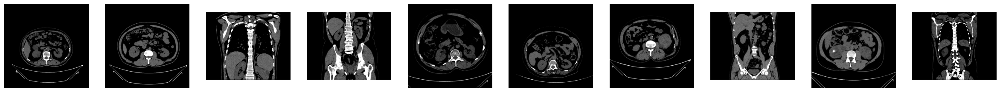

Class Stone


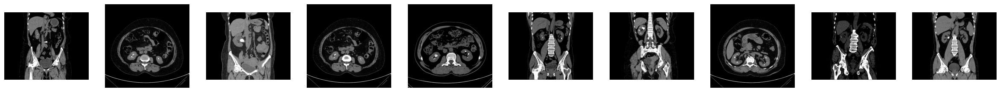

Class Tumor


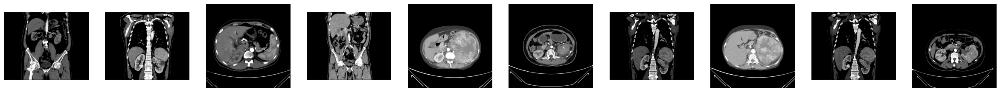

Class Normal


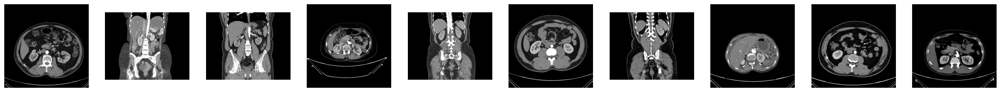

In [11]:
class Image:
    def __init__(self, path, label):
        # self.image = cv2.imread(path) # directly read
        self.path = path # only directory
        self.label = label

def load_images_from_folder(dataset_path, images_per_class=None):
    images = {}
    for class_name in os.listdir(dataset_path):
        class_folder_path = os.path.join(dataset_path, class_name)
        if os.path.isdir(class_folder_path):
            count = 0
            images[class_name] = []
            for image_name in os.listdir(class_folder_path):
                if images_per_class is None or count < images_per_class:
                    image_path = os.path.join(class_folder_path, image_name)
                    img = Image(image_path, class_name)
                    images[class_name].append(img)
                    count += 1
    return images

def imshow(images, images_per_class=None):
    for class_name, imgs in images.items():
        plt.figure(figsize=(30,30))
        print(f'Class {class_name}')
        for i in range(min(images_per_class if images_per_class else len(imgs), len(imgs))):
            plt.subplot(1, images_per_class if images_per_class else len(imgs), i+1)
            img = cv2.imread(imgs[i].path)
            # img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.imshow(img)
            # plt.title(os.path.basename(imgs[i].path))
            plt.axis('off')
        plt.show()

# Example usage:
images = load_images_from_folder('/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/dataset')
imshow(images, 10)


In [12]:
from PIL import Image

def get_image_specifications(image_path):
    # Open the image file
    with Image.open(image_path) as img:
        # Get image specifications
        image_format = img.format
        image_mode = img.mode
        image_size = img.size
        image_width, image_height = img.size
        image_color = img.getcolors()

    return f"Image Format: {image_format}\nImage Mode: {image_mode}\nImage Size: {image_size} pixels (Width: {image_width}, Height: {image_height})\nImage Colors: {image_color}"

# Example usage:
print('images.keys:', images.keys())
image_path = "/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/dataset/Cyst/Cyst- (1).jpg"
# print('image_path:',image_path := images['normal'][0].path)
image_specifications = get_image_specifications(image_path)
print(image_specifications)

images.keys: dict_keys(['Cyst', 'Stone', 'Tumor', 'Normal'])
Image Format: JPEG
Image Mode: RGB
Image Size: (705, 569) pixels (Width: 705, Height: 569)
Image Colors: [(16800, (255, 255, 255)), (83, (253, 253, 253)), (85, (251, 251, 251)), (82, (249, 249, 249)), (77, (247, 247, 247)), (91, (245, 245, 245)), (78, (243, 243, 243)), (87, (241, 241, 241)), (78, (239, 239, 239)), (69, (237, 237, 237)), (89, (235, 235, 235)), (102, (233, 233, 233)), (88, (231, 231, 231)), (89, (229, 229, 229)), (63, (227, 227, 227)), (82, (225, 225, 225)), (89, (223, 223, 223)), (158, (221, 221, 221)), (68, (219, 219, 219)), (84, (217, 217, 217)), (96, (215, 215, 215)), (113, (213, 213, 213)), (156, (211, 211, 211)), (80, (209, 209, 209)), (80, (207, 207, 207)), (89, (205, 205, 205)), (125, (203, 203, 203)), (182, (201, 201, 201)), (95, (199, 199, 199)), (86, (197, 197, 197)), (96, (195, 195, 195)), (95, (193, 193, 193)), (213, (191, 191, 191)), (95, (189, 189, 189)), (112, (187, 187, 187)), (101, (185, 185, 

## Noise Metrics

GitHub Copilot: The evaluation metrics indicate that both the Github Copilot's code and ChatGPT's code have successfully reduced the noise in the image, as evidenced by the non-infinite PSNR and non-zero RMSE values.

The PSNR (Peak Signal-to-Noise Ratio) is a measure of the peak error. The fact that PSNR is infinite for the original image indicates there's no noise (as it's being compared with itself), while for the processed images, the PSNR values are finite and quite high, indicating a low level of distortion.

The RMSE (Root Mean Square Error) is a quadratic scoring rule that measures the average magnitude of the error. The fact that RMSE is zero for the original image indicates there's no error (as it's being compared with itself), while for the processed images, the RMSE values are non-zero but quite low, indicating a low level of error.

The SNR (Signal-to-Noise Ratio) is a measure of signal strength relative to background noise. The negative SNR values indicate that the noise is stronger than the signal, which is not ideal. However, the SNR values have increased (become less negative) from the original to the processed images, indicating that the signal has become stronger relative to the noise.

In terms of comparison between Github Copilot's code and ChatGPT's code, the metrics are quite similar, but ChatGPT's code has slightly better PSNR and RMSE values, indicating slightly less distortion and error. However, the differences are quite small and may not be noticeable in the image quality.

GitHub Copilot: Dĩ nhiên, dưới đây là các định nghĩa bằng tiếng Việt:

1. PSNR (Peak Signal-to-Noise Ratio - Tỉ lệ tín hiệu so với nhiễu): PSNR là một độ đo chất lượng của hình ảnh đã được khôi phục so với hình ảnh gốc. PSNR càng cao, chất lượng hình ảnh khôi phục càng tốt và càng giống với hình ảnh gốc.

2. RMSE (Root Mean Square Error - Sai số bình phương trung bình): RMSE là một độ đo sự khác biệt giữa các giá trị dự đoán bởi một mô hình và các giá trị thực tế. RMSE càng thấp, mô hình dự đoán càng chính xác.

3. SNR (Signal-to-Noise Ratio - Tỉ lệ tín hiệu so với nhiễu): SNR là một độ đo chất lượng tín hiệu so với nhiễu. SNR càng cao, chất lượng tín hiệu càng tốt và nhiễu càng ít.

Lưu ý rằng, mặc dù PSNR, RMSE, và SNR cao thường cho thấy chất lượng hình ảnh tốt hơn, nhưng chúng không phải lúc nào cũng dẫn đến độ chính xác cao hơn trong các tác vụ phân loại.

In [ ]:
from skimage.metrics import peak_signal_noise_ratio, mean_squared_error

def calculate_metrics(original, processed):
    # Github Copilot
    # Calculate the PSNR
    psnr = peak_signal_noise_ratio(original, processed)

    # Calculate the RMSE
    rmse = np.sqrt(mean_squared_error(original, processed))

    # Calculate the SNR
    mean = np.mean(processed)
    std = np.std(processed)
    snr = 20 * np.log10(mean / (std + 1e-10)) # 1e-10: avoid error std=0

    # # ChatGPT
    # mse = np.mean((original - processed)**2)
    # rmse = np.sqrt(mse)
    # psnr = 20 * np.log10(255 / rmse)  # Assuming pixel values range from 0 to 255
    # # snr = 10 * np.log10(np.sum(original**2) / mse)
    # snr = np.mean(original) / np.std(original - processed)

    return psnr, rmse, snr

It looks like you've provided information about three different image quality metrics: PSNR (Peak Signal-to-Noise Ratio), MSE (Mean Squared Error), and AMBE (Absolute Mean Brightness Error). These metrics are commonly used for assessing the quality of reconstructed or processed images. Let me explain each of them briefly:

### 1. Peak Signal-to-Noise Ratio (PSNR):

PSNR is a measure of the quality of a reconstructed or processed image. It is expressed in decibels (dB) and is calculated using the formula:

$$ PSNR = 10 \cdot \log_{10}\left(\frac{{\text{Max Value}^2}}{{\text{MSE}}}\right) $$

Where:
- $\text{Max Value}$ is the maximum pixel value of the image (usually 255 for 8-bit images).
- $\text{MSE}$ is the Mean Squared Error between the original and processed images.

### 2. Mean Squared Error (MSE):

MSE is a measure of the average squared differences between corresponding pixels of the original and processed images. It is calculated using the formula:

$$ MSE = \frac{1}{N \times M} \sum_{i=1}^{N} \sum_{j=1}^{M} (I(i, j) - P(i, j))^2 $$

Where:
- $N$ and $M$ are the dimensions of the images.
- $I(i, j)$ is the intensity of the pixel at position $(i, j)$ in the original image.
- $P(i, j)$ is the intensity of the pixel at position $(i, j)$ in the processed image.

### 3. Absolute Mean Brightness Error (AMBE):

AMBE measures the contrast between the initial image's brightness and the improved image's brightness. It is given by the formula:

$$ AMBE = \frac{1}{N \times M} \sum_{i=1}^{N} \sum_{j=1}^{M} |I(i, j) - P(i, j)| $$

Where:
- $N$ and $M$ are the dimensions of the images.
- $I(i, j)$ is the intensity of the pixel at position $(i, j)$ in the original image.
- $P(i, j)$ is the intensity of the pixel at position $(i, j)$ in the processed image.

These metrics are commonly used for image quality assessment, and you can implement them using the appropriate formulas in your chosen programming language (such as Python). If you have specific questions or need code examples, feel free to ask!

In [ ]:
import cv2
import numpy as np

def calculate_metrics(original_image, processed_image):
    # # Load images
    # original_image = cv2.imread(original_image_path, cv2.IMREAD_GRAYSCALE)
    # processed_image = cv2.imread(processed_image_path, cv2.IMREAD_GRAYSCALE)

    # # Ensure both images have the same dimensions
    # if original_image.shape != processed_image.shape:
    #     raise ValueError("Original and processed images must have the same dimensions.")

    # Maximum pixel value (usually 255 for 8-bit images)
    max_pixel_value = 255

    # Calculate Mean Squared Error (MSE)
    mse = np.mean((original_image - processed_image) ** 2)
    rmse = np.sqrt(mse)
    # # Dimensions of the images
    # N, M = original_image.shape
    # # Calculate Mean Squared Error (MSE)
    # mse = np.sum((original_image - processed_image)**2) / (N * M)

    # Calculate Peak Signal-to-Noise Ratio (PSNR)
    psnr = 10 * np.log10(max_pixel_value**2 / mse)

    # Calculate Absolute Mean Brightness Error (AMBE)
    ambe = np.mean(np.abs(original_image - processed_image))

    return psnr, mse, rmse, ambe


## Original

In [ ]:
import os
import cv2
import numpy as np
from shutil import copyfile

def preprocess_and_copy(src_dir, dest_dir, preprocess_func):
    # Check if src_dir is a directory
    if os.path.isdir(src_dir):
        # If dest_dir does not exist, create it
        os.makedirs(dest_dir, exist_ok=True)

        # Iterate over files/directories in src_dir
        for item in os.listdir(src_dir):
            src_item_path = os.path.join(src_dir, item)
            dest_item_path = os.path.join(dest_dir, item)

            # If item is a directory, call function recursively
            if os.path.isdir(src_item_path):
                preprocess_and_copy(src_item_path, dest_item_path, preprocess_func)
            # If item is a file, apply preprocessing and copy
            elif os.path.isfile(src_item_path):
                img = cv2.imread(src_item_path)
                if img is not None:
                    img = preprocess_func(img)
                    cv2.imwrite(dest_item_path, img)

# Define your preprocessing function here
def preprocess_func(img):
    # TODO: Add your preprocessing steps here
    return img

# Usage:
dataset_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/sample'
# dataset_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/dataset'
output_path = '/content/drive/MyDrive/Colab Notebooks/Thesis/Preprocessing/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/Original'
preprocess_and_copy(dataset_path, output_path, preprocess_func)

## CLAHE

In [ ]:
import os
import cv2
import numpy as np
from shutil import copyfile

# Define that paths
dataset_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/dataset'
output_path = '/content/drive/MyDrive/Colab Notebooks/Thesis/Preprocessing/CLAHE'

# Create the output directory if it doesn't exist
os.makedirs(output_path, exist_ok=True)

# Get the list of child class folders
child_folders = os.listdir(dataset_path)

# Process each child class folder
for folder in child_folders:
    # Create the output folder for the current child class
    output_folder = os.path.join(output_path, folder)
    os.makedirs(output_folder, exist_ok=True)

    # Get the list of image files in the current child class folder
    folder_path = os.path.join(dataset_path, folder)
    image_files = os.listdir(folder_path)

    # # List of lossless formats
    # lossless_formats = ['.png']

    # Process each image file
    for image_file in image_files:
        # Read the image
        image_path = os.path.join(folder_path, image_file)
        img = cv2.imread(image_path)

        # # Preprocess the image
        # Convert the image to grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # CLAHE (Contrast Limited Adaptive Histogram Equalization)
        # create a CLAHE object (Arguments are optional).
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        cl1 = clahe.apply(gray)

        # # Reverse the image (if GRAY2BGR)
        # reversed_img = 255 - cl1
        # # Convert the reversed image back to color
        # color_img = cv2.cvtColor(reversed_img, cv2.COLOR_GRAY2BGR)

        # Export the preprocessed image to the output folder
        filename, extension = os.path.splitext(image_file)
        # output_image_path = os.path.join(output_folder, image_file)
        output_image_path = os.path.join(output_folder, filename + '.jpg') # ('jpg', 'png')

        # cv2.imwrite(output_image_path, img)
        cv2.imwrite(output_image_path, cl1)
        # cv2.imwrite(output_image_path, color_img)
        # cv2.imwrite(output_image_path, final_img)


## CLAHE + median filter

In [13]:
import os
import cv2
import numpy as np
from shutil import copyfile

def preprocess_and_copy(src_dir, dest_dir, preprocess_func):
    # Check if src_dir is a directory
    if os.path.isdir(src_dir):
        # If dest_dir does not exist, create it
        os.makedirs(dest_dir, exist_ok=True)

        # Iterate over files/directories in src_dir
        for item in os.listdir(src_dir):
            src_item_path = os.path.join(src_dir, item)

            # If item is a directory, call function recursively
            if os.path.isdir(src_item_path):
                preprocess_and_copy(src_item_path, os.path.join(dest_dir, item), preprocess_func)
            # If item is a file, apply preprocessing and copy
            elif os.path.isfile(src_item_path):
                # Define the output file path
                filename_with_ext = os.path.basename(src_item_path)
                filename, extension = os.path.splitext(filename_with_ext)
                dest_item_path = os.path.join(dest_dir, filename + '.jpg')

                # Check if output file already exists
                if not os.path.exists(dest_item_path):
                    img = cv2.imread(src_item_path)
                    if img is not None:
                        img = preprocess_func(img)

                        # Export the preprocessed image to the output folder
                        cv2.imwrite(dest_item_path, img)

# Define your preprocessing function here
def preprocess_func(img):
    # TODO: Add your preprocessing steps here
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # CLAHE (Contrast Limited Adaptive Histogram Equalization)
    # create a CLAHE object (Arguments are optional).
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl1 = clahe.apply(gray)

    # Apply median filter
    median = cv2.medianBlur(cl1, 3)

    return median

# Usage:
# dataset_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/sample'
# output_path = '/content/drive/MyDrive/Colab Notebooks/Thesis/Preprocessing/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/CLAHE_medianF3x3_sample'
dataset_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/dataset'
output_path = '/content/drive/MyDrive/Colab Notebooks/Thesis/Preprocessing/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/CLAHE_medianF3x3'
preprocess_and_copy(dataset_path, output_path, preprocess_func)

## Butterworth

### Bandpass idea

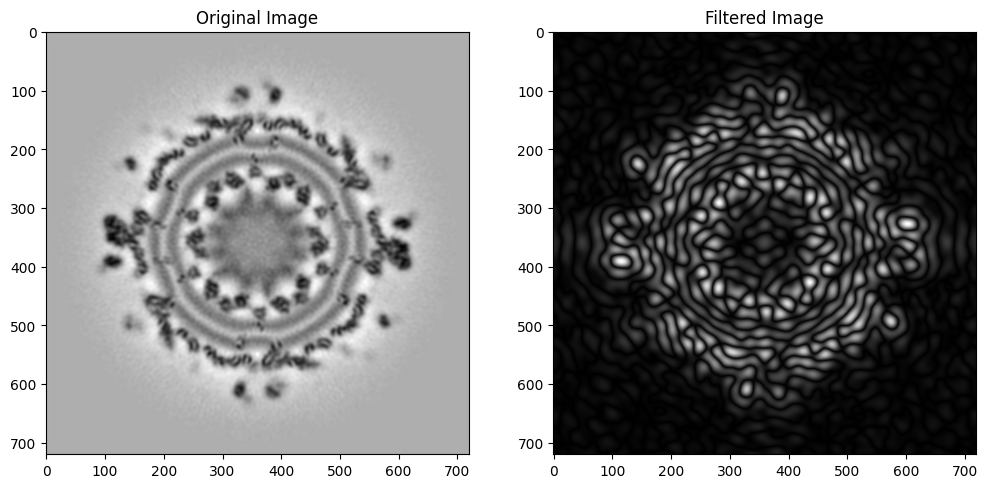

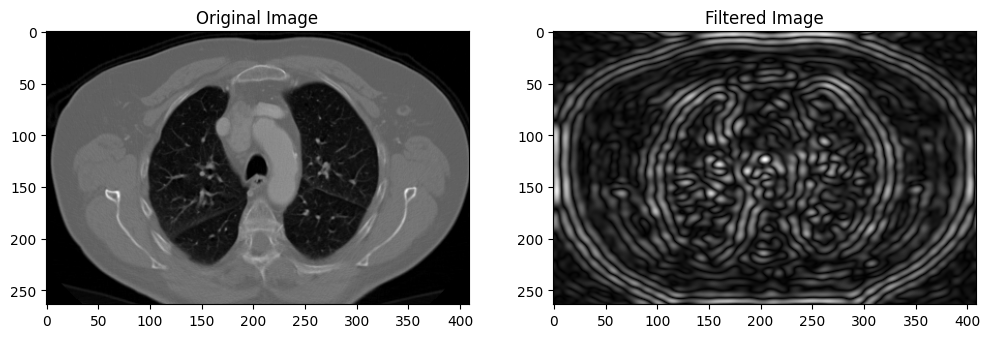

In [ ]:
import scipy.misc
import numpy, math
import scipy.fftpack as fftim
from PIL import Image
import cv2
# Opening the image and converting it to grayscale.

def bandpass(b):
    # Performing FFT.
    c = fftim.fft2(b)
    # Shifting the Fourier frequency image .
    d = fftim.fftshift(c)
    # Intializing variables for convolution function.
    M = d.shape[0]
    N = d.shape[1]
    # H is defined and
    # values in H are initialized to 1.
    H = numpy.zeros((M,N))
    center1 = M/2
    center2 = N/2
    d_0 = 30 # minimum cut-off radius
    d_1 = 50 # maximum cut-off radius

    # Defining the convolution function for bandpass
    for i in range(1,M):
        for j in range(1,N):
            r1 = (i-center1)**2+(j-center2)**2
            # Euclidean distance from
            # origin is computed.
            r = math.sqrt(r1)
            # Using min and max cut-off to create
    # the band or annulus.
            if r > d_0 and r < d_1:
                H[i,j] = 1.0

    # Converting H to an image.
    H = Image.fromarray(H)
    # Performing the convolution.
    con = d * H

    # Computing the magnitude of the inverse FFT.
    e = abs(fftim.ifft2(con))
    return e
# # Saving the image as ibandpass_output.png.
# cv2.imwrite('../Figures/ibandpass_output.png', e)
list = ['/content/drive/MyDrive/Colab Notebooks/Thesis/Preprocessing/temp/fft1.png',
        '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/sample/train/adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib/000000 (6).png']
# b = Image.open('/content/drive/MyDrive/Colab Notebooks/Thesis/Preprocessing/temp/fft1.png').convert('L')
for i in list:
    b = Image.open(i).convert('L')
    e = bandpass(b)

    # Display the original and processed images side by side

    plt.figure(figsize=(12,6))

    plt.subplot(1,2,1)
    plt.imshow(b, cmap='gray')
    plt.title('Original Image')

    plt.subplot(1,2,2)
    plt.imshow(e, cmap='gray')
    # plt.title(f'Lowcut={lowcut}, Highcut={highcut}, Order={order}')
    plt.title('Filtered Image')

    plt.show()

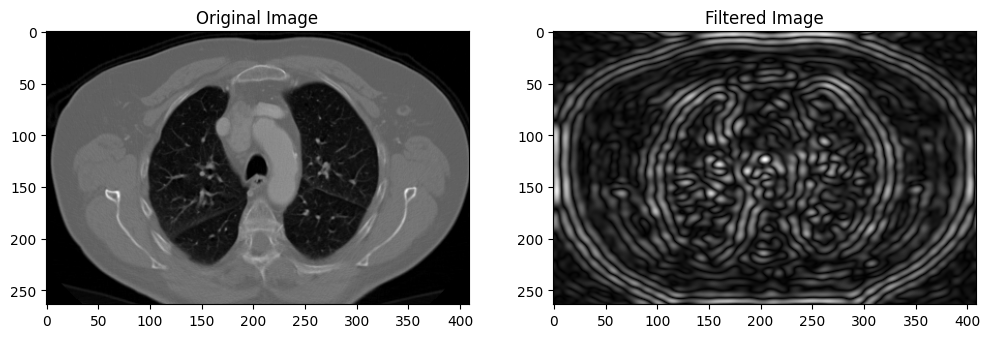

In [ ]:
import scipy.misc
import numpy, math
import scipy.fftpack as fftim
from PIL import Image
import cv2
# Opening the image and converting it to grayscale.
# b = Image.open('/content/drive/MyDrive/Colab Notebooks/Thesis/Preprocessing/temp/fft1.png').convert('L')
b = Image.open('/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/sample/train/adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib/000000 (6).png').convert('L')
# Performing FFT.
c = fftim.fft2(b)
# Shifting the Fourier frequency image .
d = fftim.fftshift(c)
# Intializing variables for convolution function.
M = d.shape[0]
N = d.shape[1]
# H is defined and
# values in H are initialized to 1.
H = numpy.zeros((M,N))
center1 = M/2
center2 = N/2
d_0 = 15.0 # minimum cut-off radius
d_1 = 30.0 # maximum cut-off radius

# Defining the convolution function for bandpass
for i in range(1,M):
    for j in range(1,N):
        r1 = (i-center1)**2+(j-center2)**2
        # Euclidean distance from
        # origin is computed.
        r = math.sqrt(r1)
        # Using min and max cut-off to create
# the band or annulus.
        if r > d_0 and r < d_1:
            H[i,j] = 1.0

# Converting H to an image.
H = Image.fromarray(H)
# Performing the convolution.
con = d * H

# Computing the magnitude of the inverse FFT.
e = abs(fftim.ifft2(con))
# # Saving the image as ibandpass_output.png.
# cv2.imwrite('../Figures/ibandpass_output.png', e)

# Display the original and processed images side by side
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.imshow(b, cmap='gray')
plt.title('Original Image')

plt.subplot(1,2,2)
plt.imshow(e, cmap='gray')
# plt.title(f'Lowcut={lowcut}, Highcut={highcut}, Order={order}')
plt.title('Filtered Image')

plt.show()

GitHub Copilot: The Butterworth bandpass filter is a type of filter that passes frequencies within a certain range and rejects frequencies outside that range. The parameters of the filter, including the low cut-off frequency (`lowcut`), high cut-off frequency (`highcut`), and order (`order`), can significantly affect the output image in terms of brightness, noise, edge sharpness, and detail.

1. `lowcut`: This parameter determines the smallest features that will be preserved in the image. If `lowcut` is set too high, smaller details in the image may be lost, and the image may appear blurred. This can also reduce the overall brightness of the image, as the low frequencies in the Fourier domain correspond to the overall brightness in the spatial domain.

2. `highcut`: This parameter determines the largest features that will be preserved in the image. If `highcut` is set too low, larger details in the image may be lost, and the image may appear more noisy. This can also reduce the contrast of the image, as the high frequencies in the Fourier domain correspond to the edges and fine details in the spatial domain.

3. `order`: This parameter determines the sharpness of the transition between the passband and the stopband. A higher order results in a steeper transition, which can help to more precisely control which frequencies are passed and which are stopped. However, a higher order can also result in more ringing artifacts in the spatial domain, which can appear as ripples or echoes near the edges of objects.

In general, you would need to adjust these parameters based on the specific characteristics of your image and the desired output. For example, if your image has a lot of small details and you want to preserve these while reducing noise, you might choose a lower `lowcut` and a higher `highcut`. If your image has a lot of large objects and you want to enhance these while reducing smaller details, you might choose a higher `lowcut` and a lower `highcut`. The `order` can be adjusted based on how sharp you want the transition between the passband and the stopband to be.

In [ ]:
rows, cols = 3, 4 # image.shape

# # part code 1:
# Create a meshgrid for the (u, v) coordinates
x = np.linspace(-0.5, 0.5, cols, endpoint=False) * cols
y = np.linspace(-0.5, 0.5, rows, endpoint=False) * rows
x, y = np.meshgrid(x, y)
radius = np.sqrt(x**2 + y**2)
# Calculate the distance to the center of the frequency domain
display(x, y, radius)

# part code 2:
x = np.linspace(-0.5, 0.5, cols) * cols
y = np.linspace(-0.5, 0.5, rows) * rows
radius = np.sqrt((x[np.newaxis,:]**2) + (y[:,np.newaxis]**2))
display(x, y, radius)

array([[-2., -1.,  0.,  1.],
       [-2., -1.,  0.,  1.],
       [-2., -1.,  0.,  1.]])

array([[-1.5, -1.5, -1.5, -1.5],
       [-0.5, -0.5, -0.5, -0.5],
       [ 0.5,  0.5,  0.5,  0.5]])

array([[2.5       , 1.80277564, 1.5       , 1.80277564],
       [2.06155281, 1.11803399, 0.5       , 1.11803399],
       [2.06155281, 1.11803399, 0.5       , 1.11803399]])

array([-2.        , -0.66666667,  0.66666667,  2.        ])

array([-1.5,  0. ,  1.5])

array([[2.5       , 1.6414763 , 1.6414763 , 2.5       ],
       [2.        , 0.66666667, 0.66666667, 2.        ],
       [2.5       , 1.6414763 , 1.6414763 , 2.5       ]])

GitHub Copilot: The radius calculation is used to determine the distance of each point in the frequency domain from the center. This distance is then used to determine whether a given frequency should be passed or stopped by the filter.

In Code 1, the `np.meshgrid` function is used to create a two-dimensional grid of `x` and `y` values, and the radius is calculated as the Euclidean distance from each point to the center of the grid (0.5, 0.5). This means that the filter will be centered around the middle of the frequency domain, which corresponds to the low frequencies in the image.

In Code 2, the `x` and `y` values are scaled by the width and height of the image, respectively, before the radius is calculated. This means that the filter will be centered around the origin of the frequency domain, which corresponds to the high frequencies in the image.

The choice between these two methods depends on the specific characteristics of your image and the desired output. If your image has a lot of high-frequency noise that you want to remove, you might choose the method from Code 2. If your image has a lot of low-frequency noise or you want to preserve the low-frequency components of the image, you might choose the method from Code 1.

In both cases, you would need to adjust the `lowcut` and `highcut` frequencies based on the specific frequencies you want to pass or stop. The `lowcut` frequency should be set to the smallest feature size you want to preserve, and the `highcut` frequency should be set to the largest feature size you want to preserve.

### Option 1:

In [ ]:
import numpy as np
import cv2
from scipy.fftpack import fftshift, ifftshift, fft2, ifft2

import os
from shutil import copyfile

# Define that paths
dataset_path = '/content/COVID19_Pneumonia_Normal_Chest_Xray_PA/sample'
output_path = '/content/drive/MyDrive/Colab Notebooks/Thesis/Preprocessing/CLAHE_Butterworth_HE_8'

# Create the output directory if it doesn't exist
os.makedirs(output_path, exist_ok=True)

# Get the list of child class folders
child_folders = os.listdir(dataset_path)

def butterworth_bandpass_filter(image, low_cutoff, high_cutoff, order=2):
    rows, cols = image.shape
    x = np.linspace(-0.5, 0.5, cols, endpoint=False)
    y = np.linspace(-0.5, 0.5, rows, endpoint=False)
    [x, y] = np.meshgrid(x, y)
    radius = np.sqrt((x ** 2) + (y ** 2))
    filter_ = 1 / (1.0 + (radius / low_cutoff) ** (2 * order))
    filter_ = 1 - filter_
    filter_ = 1 - 1 / (1.0 + (radius / high_cutoff) ** (2 * order)) * filter_
    return filter_


# Process each child class folder
for folder in child_folders:
    # Create the output folder for the current child class
    output_folder = os.path.join(output_path, folder)
    os.makedirs(output_folder, exist_ok=True)

    # Get the list of image files in the current child class folder
    folder_path = os.path.join(dataset_path, folder)
    image_files = os.listdir(folder_path)

    # Process each image file
    for image_file in image_files:
        # Read the image
        image_path = os.path.join(folder_path, image_file)
        img = cv2.imread(image_path, 0)

        # Apply CLAHE
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        cl1 = clahe.apply(img)

        # Apply Butterworth bandpass filter
        img_dft = fftshift(fft2(cl1))
        # filter_ = butterworth_bandpass_filter(cl1, low_cutoff=0.0, high_cutoff=0.3)
        # filter_ = butterworth_bandpass_filter(cl1, low_cutoff=0.05, high_cutoff=0.5)  # Adjust the cutoff frequencies
        filter_ = butterworth_bandpass_filter(cl1, low_cutoff=0.2, high_cutoff=0.3)
        img_filtered = np.abs(ifft2(ifftshift(img_dft * filter_)))

        # Normalize the filtered image to the range [0, 255]
        img_filtered = cv2.normalize(img_filtered, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)

        # Apply histogram equalization
        equalized_image = cv2.equalizeHist(img_filtered)

        # Export the preprocessed image to the output folder
        filename, extension = os.path.splitext(image_file)
        output_image_path = os.path.join(output_folder, filename + '.jpg')
        # cv2.imwrite(output_image_path, img_filtered)
        cv2.imwrite(output_image_path, equalized_image)

In [ ]:
import os
import cv2
import numpy as np
from scipy.fftpack import fftshift, ifftshift, fft2, ifft2
from shutil import copyfile

# Define the paths
output_path = '/content/drive/MyDrive/Colab Notebooks/Thesis/Preprocessing/CLAHE_Butterworth_HE_6'

# Define Butterworth low pass and high pass filters
def butterworth_bandpass_filter(image, low_cutoff, high_cutoff, order=2):
    # Get the image dimensions
    rows, cols = image.shape

    # Create a meshgrid for the (u, v) coordinates
    x = np.linspace(-0.5, 0.5, cols, endpoint=False)
    y = np.linspace(-0.5, 0.5, rows, endpoint=False)
    u, v = np.meshgrid(x, y)

    # Calculate the distance to the center of the frequency domain
    D = np.sqrt(u**2 + v**2)

    # Create the Butterworth bandpass filter
    H = 1 / (1 + (D / low_cutoff)**(2*order)) * (1 - 1 / (1 + (D / high_cutoff)**(2*order)))

    # Apply the filter to the image in the frequency domain
    G = H * fftshift(fft2(image))

    # Convert the image back to the spatial domain
    filtered_image = np.abs(ifft2(ifftshift(G)))

    # Normalize the filtered image to the range [0, 255]
    filtered_image = cv2.normalize(filtered_image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)

    return filtered_image


# Get the list of child class folders
child_folders = os.listdir(dataset_path)

# Process each child class folder
for folder in child_folders:
    # Create the output folder for the current child class
    output_folder = os.path.join(output_path, folder)
    os.makedirs(output_folder, exist_ok=True)

    # Get the list of image files in the current child class folder
    folder_path = os.path.join(dataset_path, folder)
    image_files = os.listdir(folder_path)

    # Process each image file
    for image_file in image_files:
        # Read the image
        image_path = os.path.join(folder_path, image_file)
        img = cv2.imread(image_path, 0)

        # Apply CLAHE
        clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
        cl1 = clahe.apply(img)

        # Apply the Butterworth bandpass filter to the image
        filtered_image = butterworth_bandpass_filter(cl1, low_cutoff=0.01, high_cutoff=0.3)

        # Preserve brightness
        filtered_image = cv2.addWeighted(cl1, 0.5, filtered_image, 0.5, 0)

        # Apply histogram equalization
        # equalized_image = cv2.equalizeHist(filtered_image)

        # Export the preprocessed image to the output folder
        filename, extension = os.path.splitext(image_file)
        output_image_path = os.path.join(output_folder, filename + '.jpg')
        cv2.imwrite(output_image_path, filtered_image)
        # cv2.imwrite(output_image_path, equalized_image)

#### v1.1

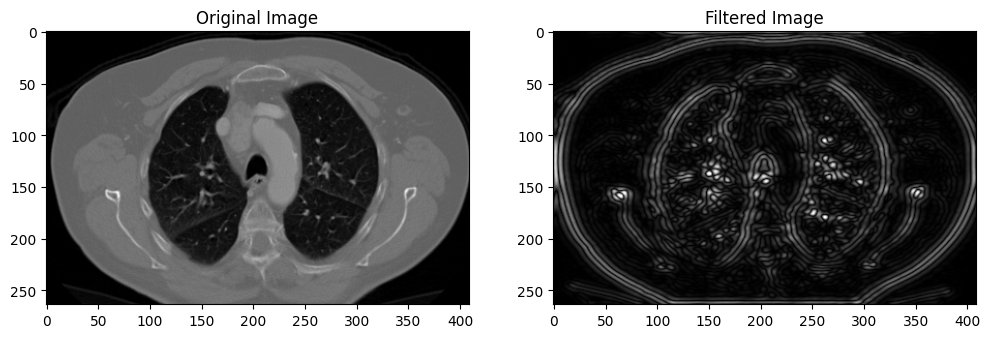

In [ ]:
# Import the necessary libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import fftshift, ifftshift, fft2, ifft2

# Load the image
img_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/sample/train/adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib/000000 (6).png'
# img_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/sample/train/large.cell.carcinoma_left.hilum_T2_N2_M0_IIIa/000002.png'
# img_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/sample/train/normal/2 (2) - Copy.png'
# img_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/sample/train/squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa/000002 (4).png'
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

def butterworth_bandpass_filter(image, lowcut, highcut, order=3):
    rows, cols = image.shape
    x = np.linspace(-0.5, 0.5, cols) * cols
    y = np.linspace(-0.5, 0.5, rows) * rows
    [x, y] = np.meshgrid(x, y)
    radius = np.sqrt((x ** 2) + (y ** 2))

    # Compute the low-pass filter
    lowpass = 1 / (1.0 + (radius / lowcut)**(2*order))

    # Compute the high-pass filter
    highpass = 1.0 - 1 / (1.0 + (radius / highcut)**(2*order))

    # Multiply the filters to get the band-pass filter
    bandpass = lowpass * highpass

    # Apply the filter to the Fourier transform of the image
    image_fft = fftshift(fft2(image))
    filtered_fft = image_fft * bandpass

    # Compute the inverse Fourier transform to get the filtered image
    filtered_image = np.abs(ifft2(ifftshift(filtered_fft)))

    # Scale the filtered image to the same range as the original image
    min_val = np.min(image)
    max_val = np.max(image) * 1.3 # Increase the maximum value to make the image brighter
    filtered_image = (filtered_image - np.min(filtered_image)) * (max_val - min_val) / (np.max(filtered_image) - np.min(filtered_image)) + min_val

    # # Add a constant value to all the pixels in the image to increase the brightness
    # filtered_image += 1  # Adjust this value as needed

    # Clip the pixel values to the valid range for images (0-255)
    filtered_image = np.clip(filtered_image, 0, 255)

    return filtered_image

# Apply Butterworth bandpass filter with the current parameters
filtered_img = butterworth_bandpass_filter(img, lowcut=30, highcut=50, order=3)

# Display the original and processed images side by side
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')

plt.subplot(1,2,2)
plt.imshow(filtered_img, cmap='gray')
plt.title('Filtered Image')

plt.show()

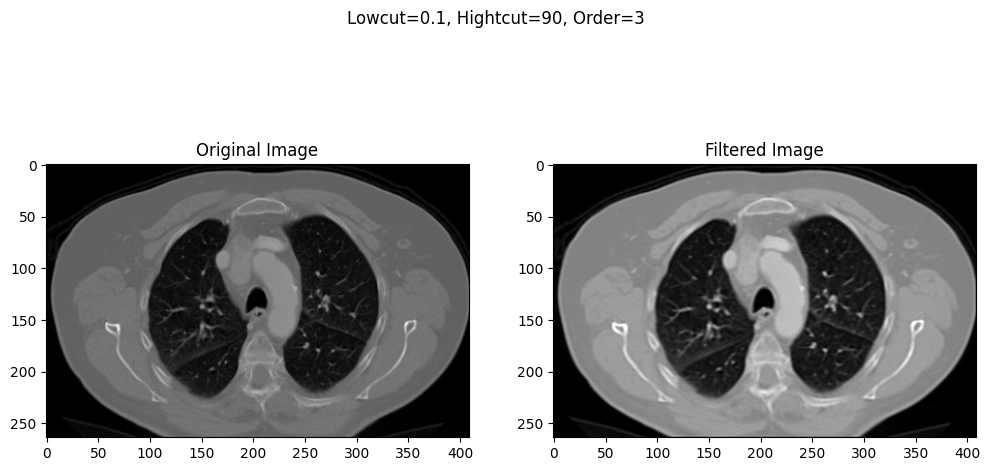

<ipython-input-20-21d9fa5e8d68>:5: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr = peak_signal_noise_ratio(original, processed)


PSNR: 18.592995406624524
RMSE: 29.98405805604832
SNR: 3.2756913234979272


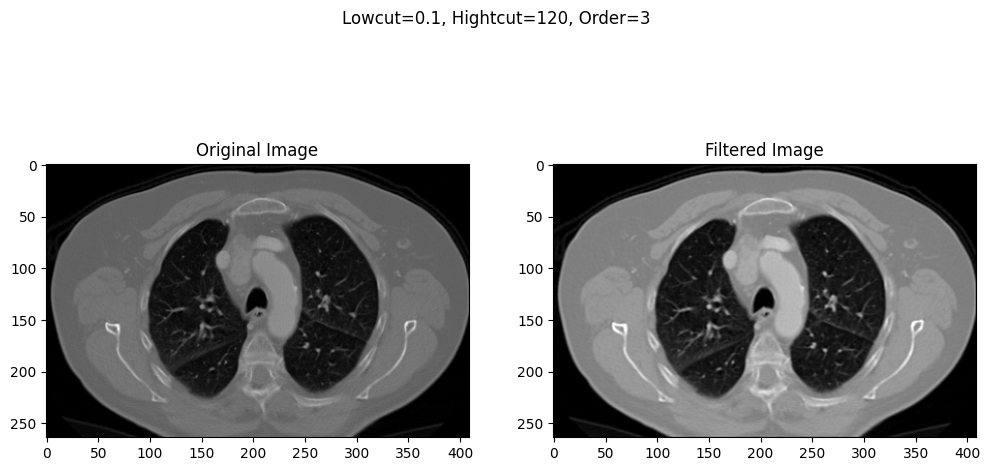

PSNR: 19.636533374531055
RMSE: 26.58970454924248
SNR: 3.2452544851174285


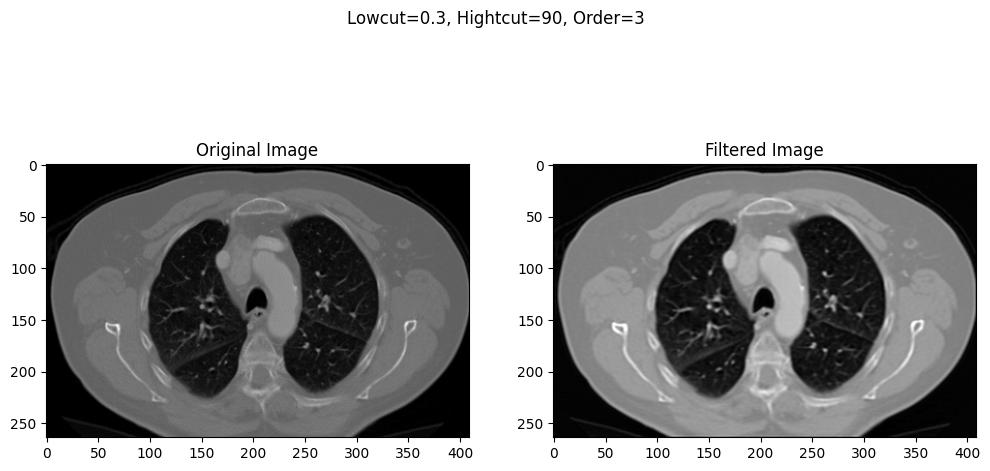

PSNR: 19.14018351547671
RMSE: 28.15340997597169
SNR: 3.1843507640090984


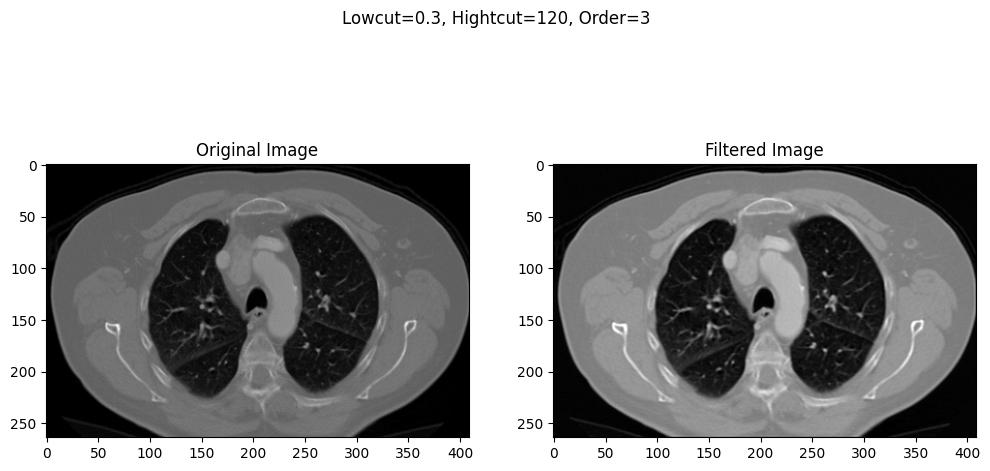

PSNR: 20.245028897135803
RMSE: 24.79069690187278
SNR: 3.159361469210201


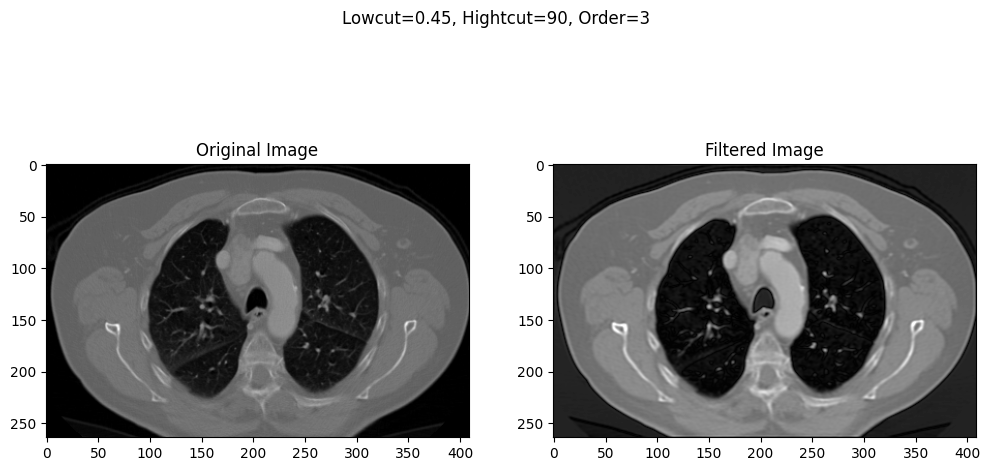

PSNR: 21.450512616396647
RMSE: 21.578166985224957
SNR: 3.7797335520530377


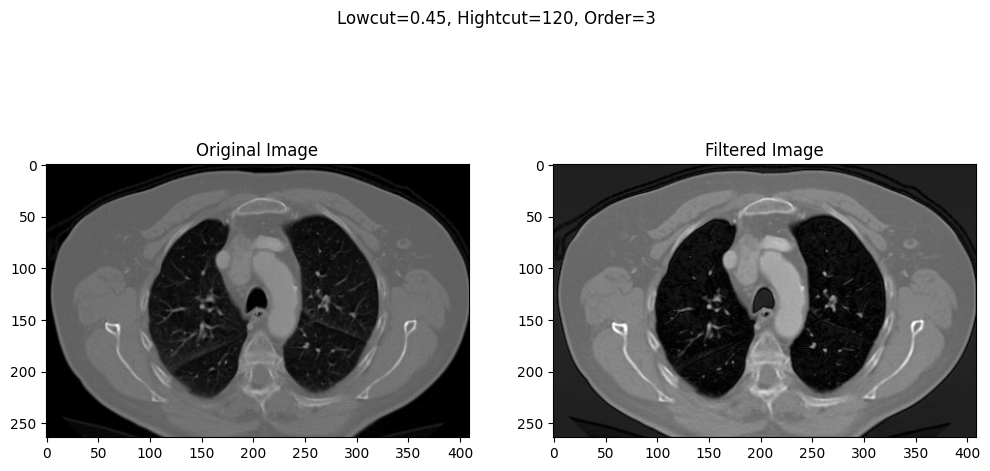

PSNR: 22.46509756599918
RMSE: 19.199295905103046
SNR: 3.7864843076601455


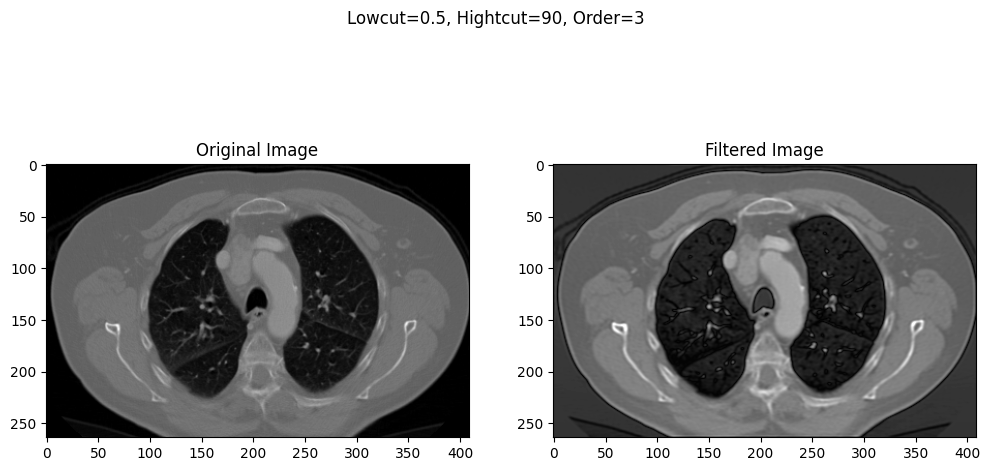

PSNR: 20.33022965794912
RMSE: 24.548711245757957
SNR: 5.5223373046935285


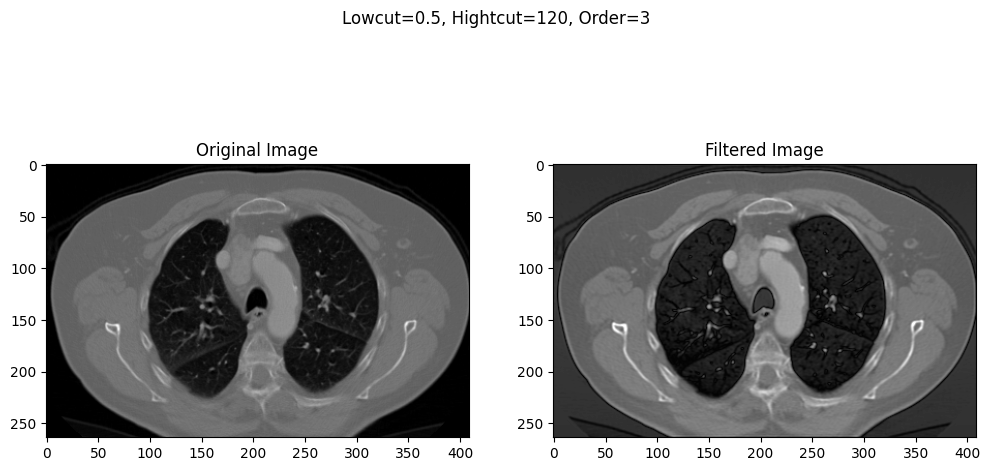

PSNR: 20.875071696828304
RMSE: 23.05613973560727
SNR: 5.524849603347384


In [ ]:
# Define the parameters to test
lowcuts = [0.1, 0.3, 0.45, 0.5]
highcuts = [90, 120]
orders = [3]

# Test each combination of parameters
for lowcut in lowcuts:
  for highcut in highcuts:
      for order in orders:

        # Apply Butterworth bandpass filter with the current parameters
        filtered_img = butterworth_bandpass_filter(img, lowcut=lowcut, highcut=highcut, order=order)

        # Display the original and processed images side by side
        plt.figure(figsize=(12,6))

        plt.subplot(1,2,1)
        plt.imshow(img, cmap='gray')
        plt.title('Original Image')

        plt.subplot(1,2,2)
        plt.imshow(filtered_img, cmap='gray')
        plt.title('Filtered Image')

        # Add a common title
        plt.suptitle(f'Lowcut={lowcut}, Hightcut={highcut}, Order={order}')
        plt.show()

        # Calculate the metrics for the filtered image
        psnr, rmse, snr = calculate_metrics(img, filtered_img)
        print(f"PSNR: {psnr}")
        print(f"RMSE: {rmse}")
        print(f"SNR: {snr}")

### Option 2:

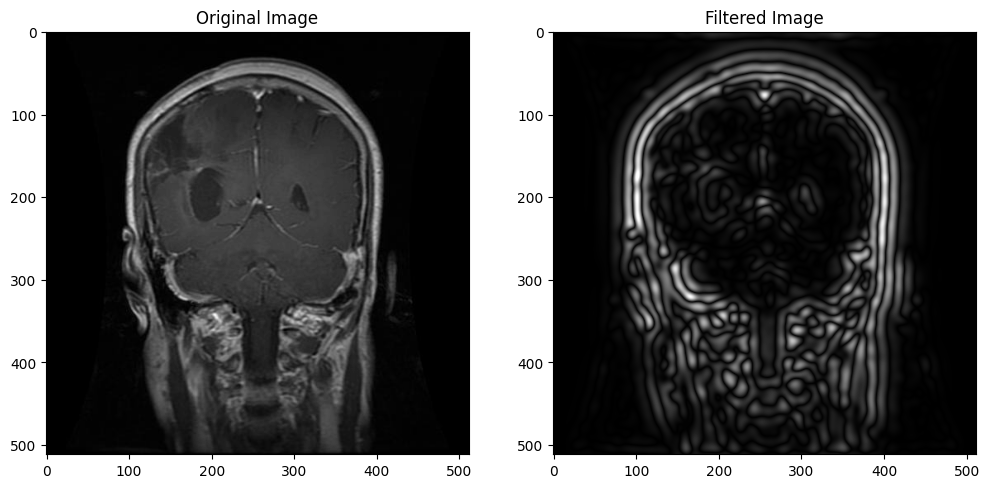

In [ ]:
# Import the necessary libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import fftshift, ifftshift, fft2, ifft2

# Load the image
img_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/sample/Training/glioma/Tr-gl_0010.jpg'
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

def butterworth_bandpass_filter(image, lowcut, highcut, order=3):
    rows, cols = image.shape
    x = np.linspace(-0.5, 0.5, cols) * cols
    y = np.linspace(-0.5, 0.5, rows) * rows
    radius = np.sqrt((x[np.newaxis,:]**2) + (y[:,np.newaxis]**2))

    # Compute the low-pass filter
    lowpass = 1 / (1.0 + (radius / lowcut)**(2*order))

    # Compute the high-pass filter
    highpass = 1.0 - 1 / (1.0 + (radius / highcut)**(2*order))

    # Multiply the filters to get the band-pass filter
    bandpass = lowpass * highpass

    # Apply the filter to the Fourier transform of the image
    image_fft = fftshift(fft2(image))
    filtered_fft = image_fft * bandpass

    # Compute the inverse Fourier transform to get the filtered image
    filtered_image = np.abs(ifft2(ifftshift(filtered_fft)))

    # Scale the filtered image to the same range as the original image
    min_val = np.min(image)
    max_val = np.max(image) * 1.1 # Increase the maximum value to make the image brighter
    filtered_image = (filtered_image - np.min(filtered_image)) * (max_val - min_val) / (np.max(filtered_image) - np.min(filtered_image)) + min_val

    # # Add a constant value to all the pixels in the image to increase the brightness
    # filtered_image += 1  # Adjust this value as needed

    # Clip the pixel values to the valid range for images (0-255)
    filtered_image = np.clip(filtered_image, 0, 255)

    return filtered_image

# Apply Butterworth bandpass filter with the current parameters
filtered_img = butterworth_bandpass_filter(img, lowcut=15, highcut=30, order=3)

# Display the original and processed images side by side
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')

plt.subplot(1,2,2)
plt.imshow(filtered_img, cmap='gray')
plt.title('Filtered Image')

plt.show()

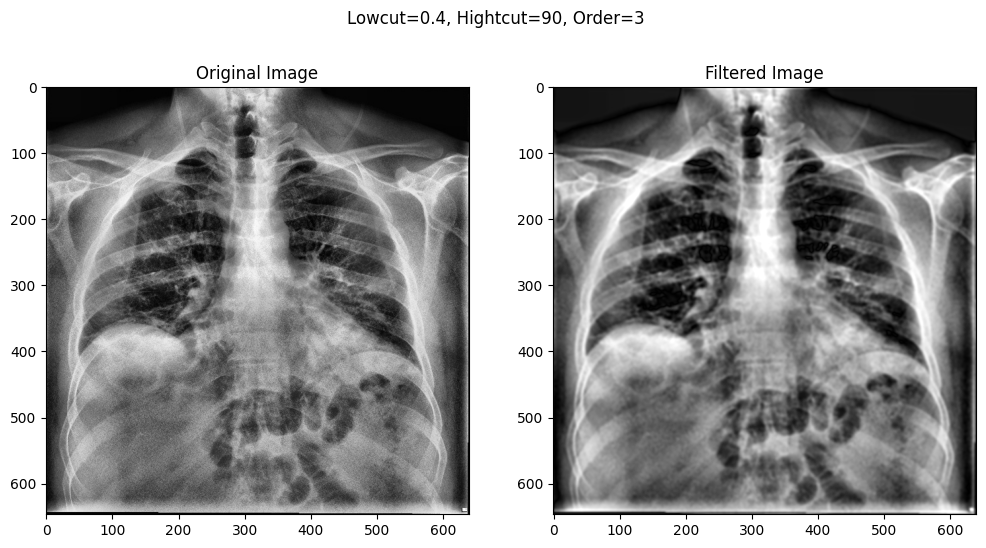

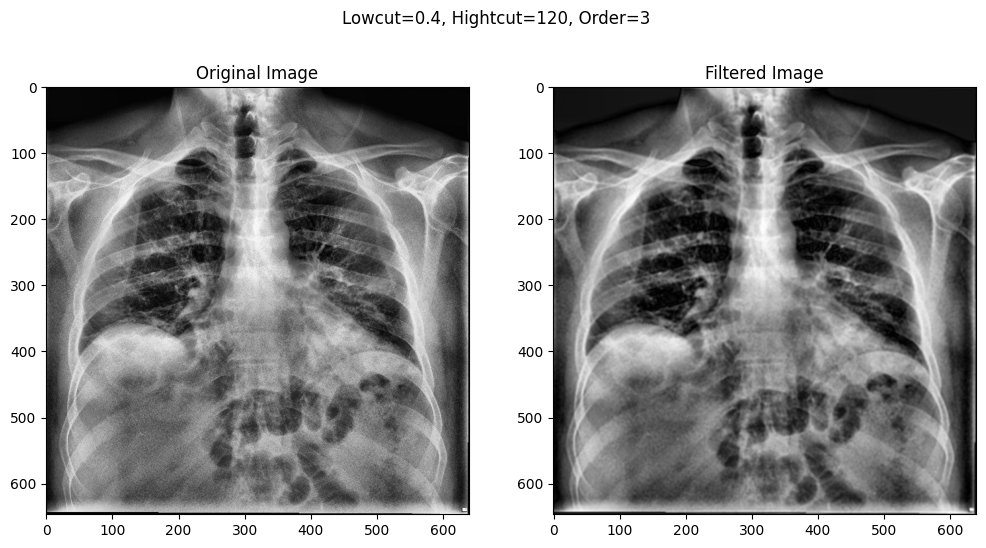

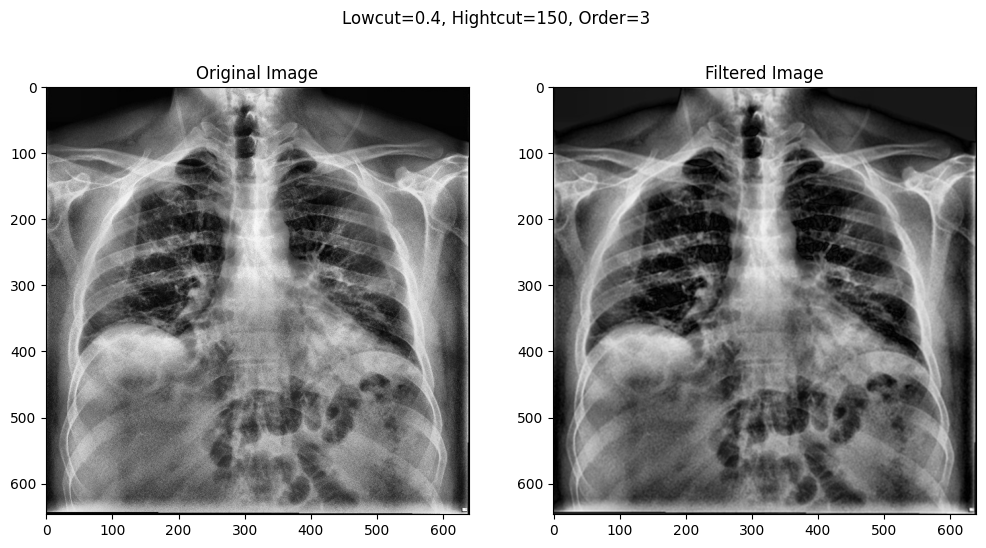

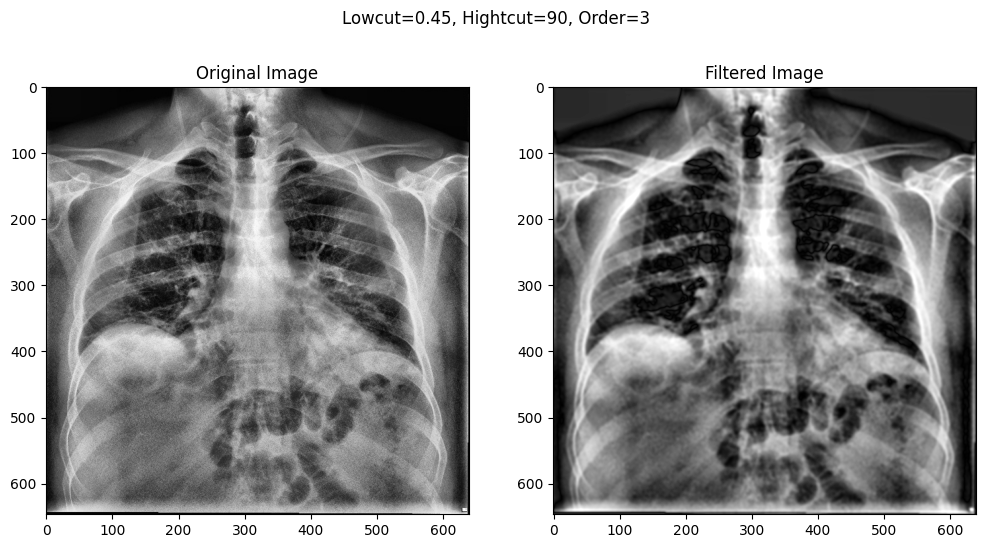

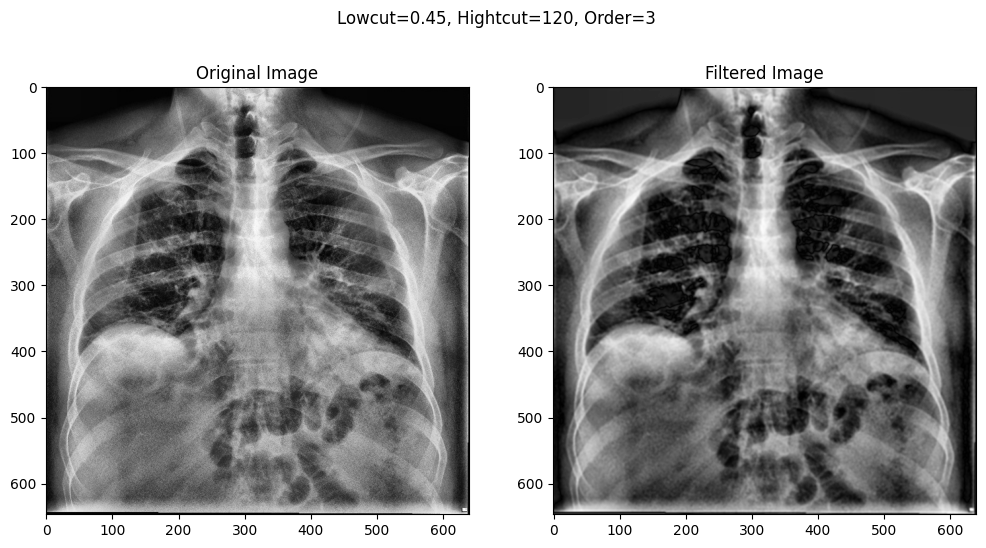

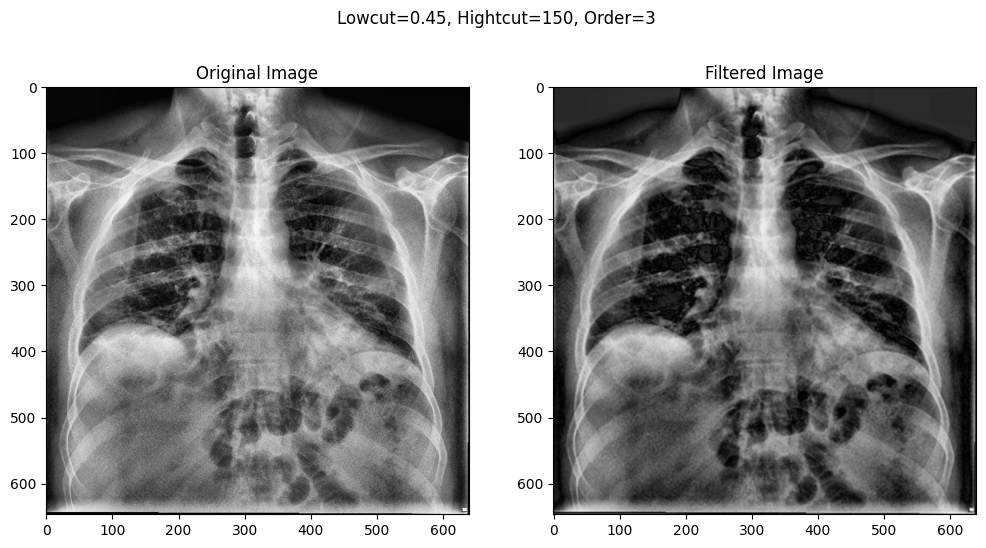

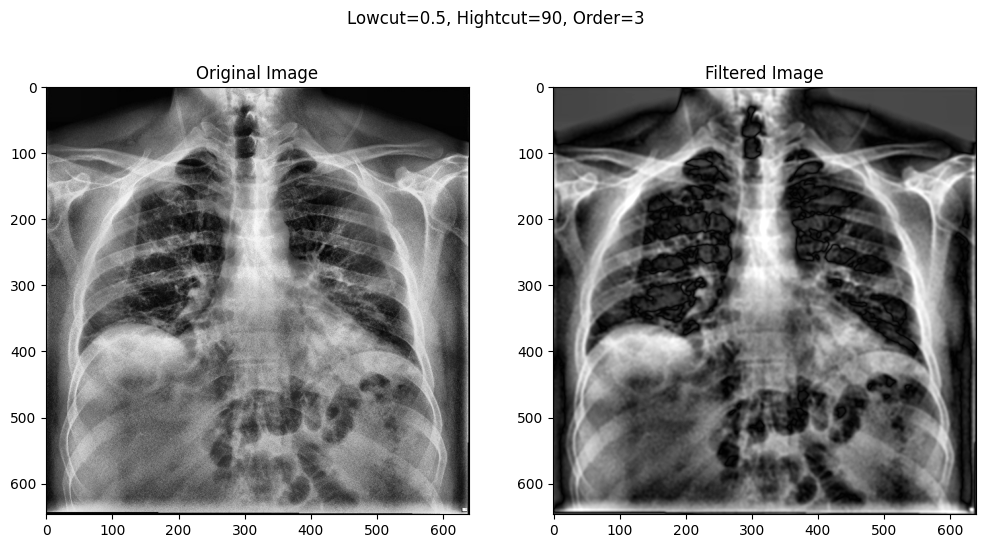

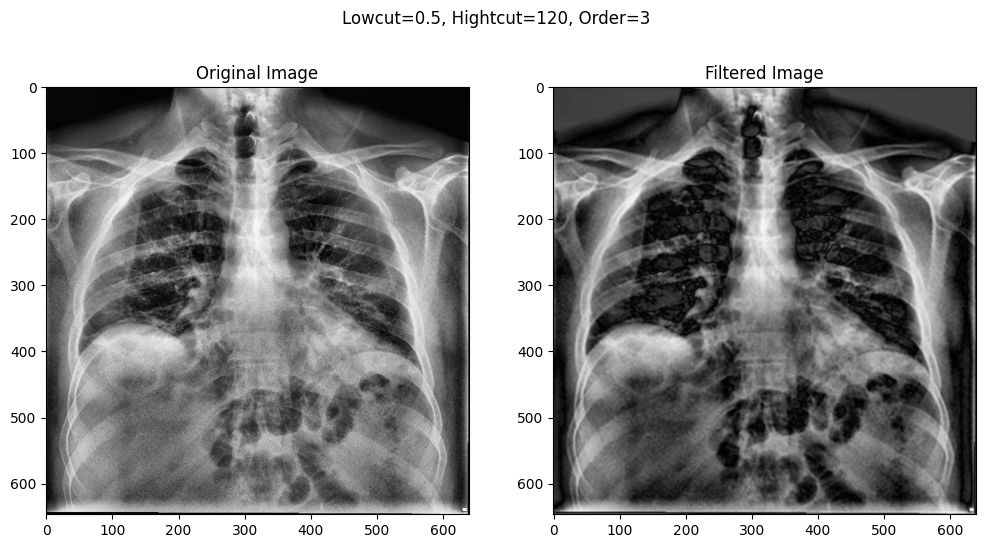

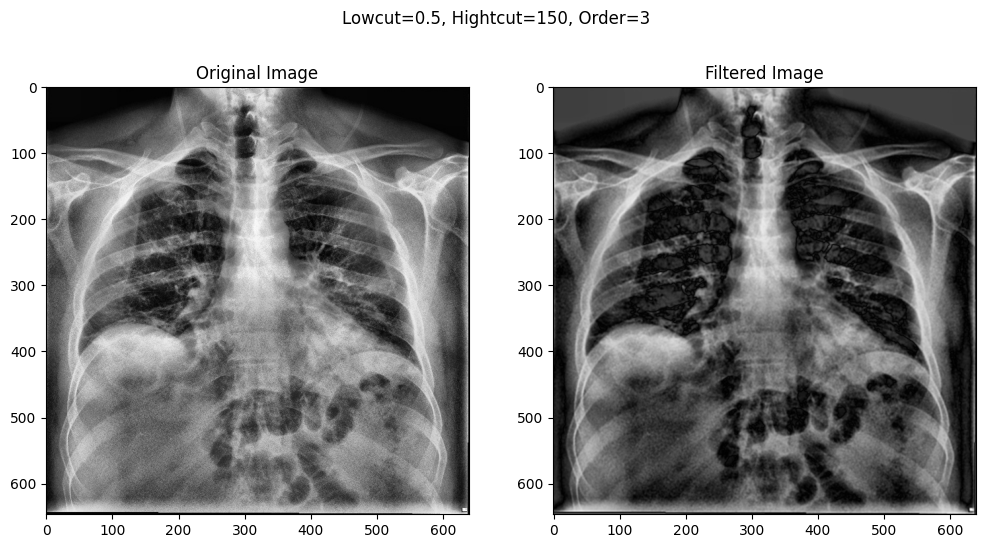

In [ ]:
# Define the parameters to test
lowcuts = [0.4, 0.45, 0.5]
highcuts = [90, 120, 150]
orders = [3]

# Test each combination of parameters
for lowcut in lowcuts:
  for highcut in highcuts:
      for order in orders:

        # Apply Butterworth bandpass filter with the current parameters
        filtered_img = butterworth_bandpass_filter(img, lowcut=lowcut, highcut=highcut, order=order)

        # Display the original and processed images side by side
        plt.figure(figsize=(12,6))

        plt.subplot(1,2,1)
        plt.imshow(img, cmap='gray')
        plt.title('Original Image')

        plt.subplot(1,2,2)
        plt.imshow(filtered_img, cmap='gray')
        plt.title('Filtered Image')

        # Add a common title
        plt.suptitle(f'Lowcut={lowcut}, Hightcut={highcut}, Order={order}')
        plt.show()

### Option 3:

It seems like you've provided a description of the application of a Butterworth bandpass filter in the context of image processing. Let me break down the information for better understanding:

1. **Objective:**
   - The goal is to eliminate noise from an image obtained in a previous step.

2. **Filter Type:**
   - A Butterworth bandpass filter (HBP) is employed for this purpose.

3. **Filter Calculation:**
   - The Butterworth bandpass filter is computed by combining the low-pass (HLP) and high-pass (HHP) filters.

4. **Low-Pass Filter (HLP):**
   - The low-pass filter is calculated using the formula:
$$ HLP(u, v) = \frac{1}{1 + \left(\frac{F(u, v)}{FL}\right)^{2n}} $$
     - $FL$ is the cut frequency of the low-pass filter (set to 15).
     - $F(u, v)$ is the distance from the origin.

5. **High-Pass Filter (HHP):**
   - The high-pass filter is calculated using the formula:
$$ HHP(u, v) = 1 - \frac{1}{1 + \left(\frac{F(u, v)}{FH}\right)^{2n}} $$
     - $FH$ is the cut frequency of the high-pass filter (set to 30).
     - $F(u, v)$ is the distance from the origin.

6. **Filter Order:**
   - $n$ is the filter order and is set to 3.

7. **Bandpass Filter (HBP):**
   - The Butterworth bandpass filter is obtained by multiplying the low-pass and high-pass filters:
     $$ HBP(u, v) = HLP(u, v) \times HHP(u, v) $$

8. **Filter Parameters:**
   - $FL$ and $FH$ are the cut frequencies for low and high-pass filters, respectively.
   - $n$ is the filter order.

In summary, this process involves designing a Butterworth bandpass filter with specific parameters to reduce noise in an image. The cut frequencies, filter order, and distance from the origin play crucial roles in determining the characteristics of the filter.

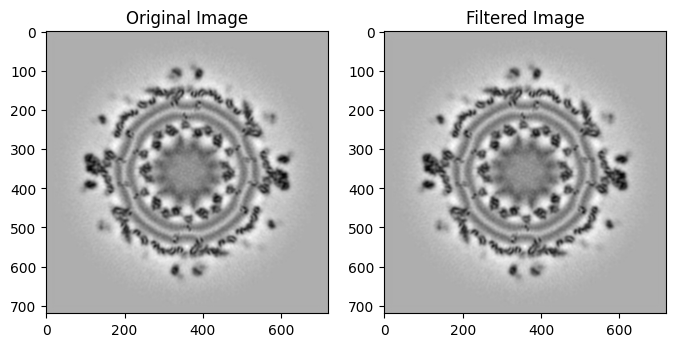

<ipython-input-66-9ae7ad7f73ac>:6: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr = peak_signal_noise_ratio(original, processed)


PSNR: 3.604808218016032
RMSE: 168.38359191265843
SNR: 14.97483354966894


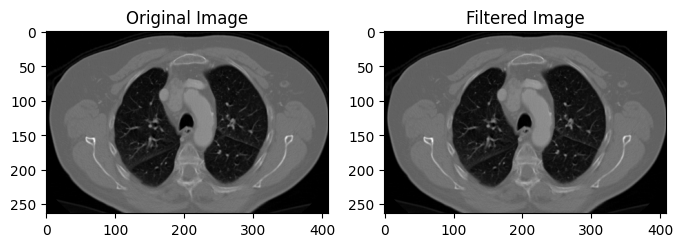

PSNR: 9.45243181440577
RMSE: 85.8852510980274
SNR: 3.239294256516936


In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# from scipy import fftpack
# from PIL import Image


# def butterworth_bandpass_filter(image, low_cutoff, high_cutoff, filter_order):
#     rows, cols = image.shape
#     center_row, center_col = rows // 2, cols // 2

#     # Create a grid of frequencies
#     u = np.fft.fftfreq(rows, 1) # 1 is the spacing between values
#     v = np.fft.fftfreq(cols, 1)
#     u, v = np.meshgrid(u, v, indexing='ij')  # 'ij' indexing produces a meshgrid with matrix indexing

#     # Calculate distance from the origin
#     distance = np.sqrt((u - center_row)**2 + (v - center_col)**2)

#     # Low Pass Filter
#     HLP = 1 / (1 + (distance / low_cutoff)**(2 * filter_order))

#     # High Pass Filter
#     HHP = 1 - 1 / (1 + (distance / high_cutoff)**(2 * filter_order))

#     # Bandpass Filter
#     HBP = HLP * HHP

#     # Apply the filter to the Fourier transform of the image
#     filtered_image = np.fft.ifft2(np.fft.fft2(image) * HBP).real

#     return filtered_image

# # Example usage:
# # Assuming 'your_image' is the image you want to filter
# # Set your desired parameters
# cut_frequency_low = 15
# cut_frequency_high = 30
# filter_order = 3

# list = ['/content/drive/MyDrive/Colab Notebooks/Thesis/Preprocessing/temp/fft1.png',
#         '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/sample/train/adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib/000000 (6).png']
# for image_path in list:
#     img = Image.open(image_path).convert('L')
#     img_array = np.array(img)  # Convert the PIL Image to a numpy array

#     # Apply Butterworth Bandpass Filter
#     filtered_result = butterworth_bandpass_filter(img_array, cut_frequency_low, cut_frequency_high, filter_order)

#     # Display the original and filtered images
#     plt.figure(figsize=(8, 4))
#     plt.subplot(1, 2, 1)
#     plt.title('Original Image')
#     plt.imshow(img, cmap='gray')

#     plt.subplot(1, 2, 2)
#     plt.title('Filtered Image')
#     plt.imshow(filtered_result, cmap='gray')

#     plt.show()

#     # Calculate the metrics for the filtered image
#     psnr, rmse, snr = calculate_metrics(img_array, filtered_result)
#     print(f"PSNR: {psnr}")
#     print(f"RMSE: {rmse}")
#     print(f"SNR: {snr}")


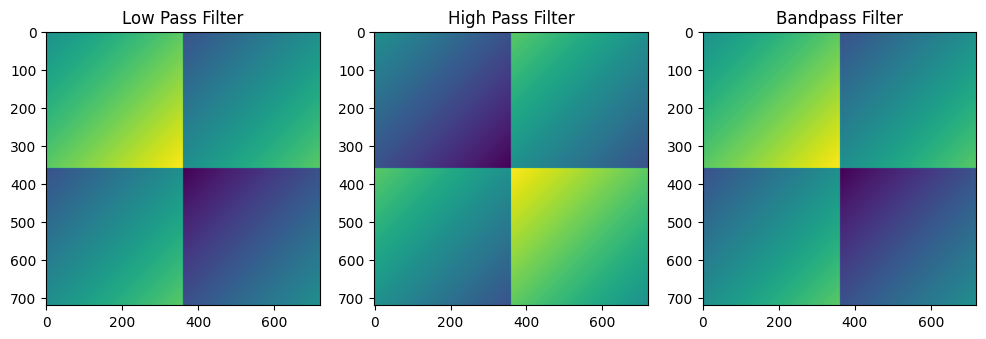

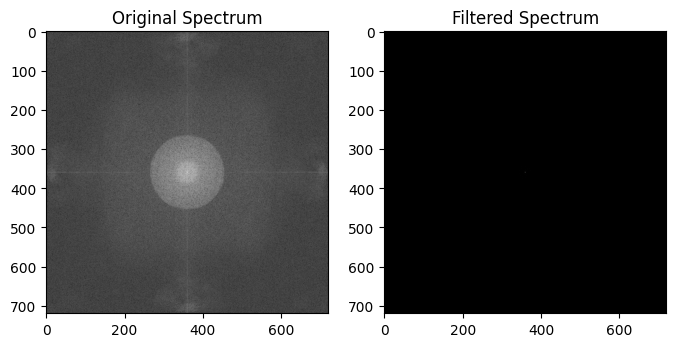

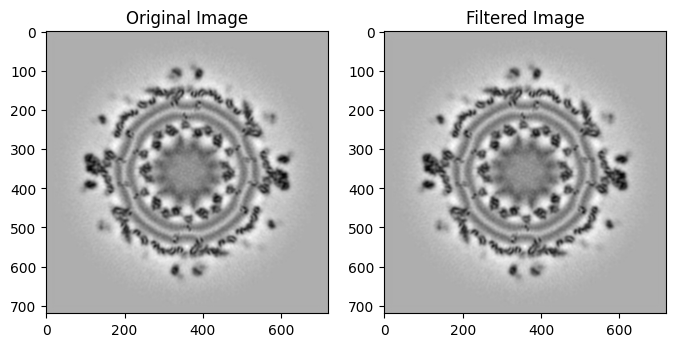

PSNR: 3.60 dB
MSE: 28353.03 - RMSE: 168.38
AMBE: 165.79


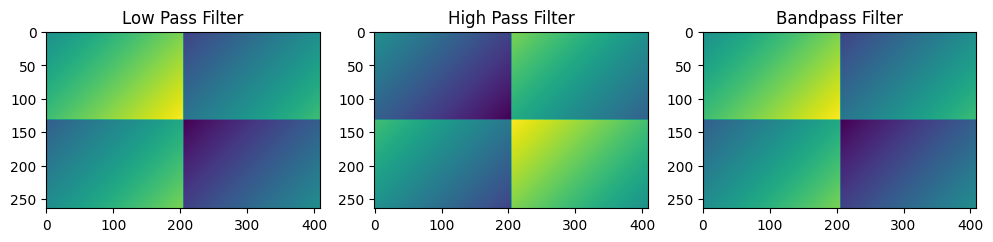

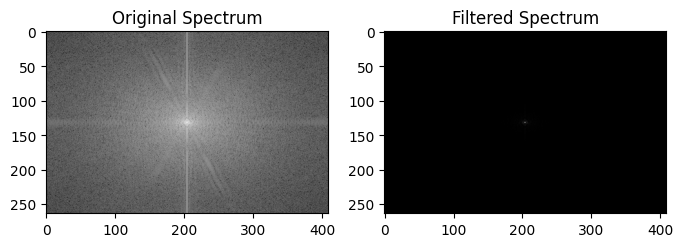

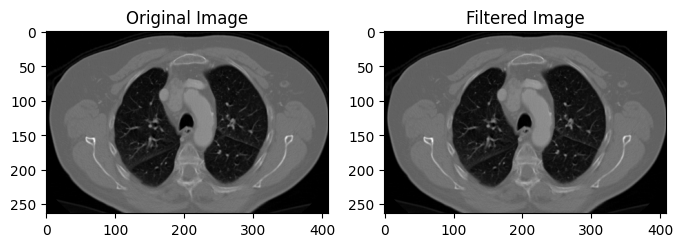

PSNR: 9.45 dB
MSE: 7376.28 - RMSE: 85.89
AMBE: 70.73


In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# from scipy import fftpack
# from PIL import Image


# def butterworth_bandpass_filter(image, low_cutoff, high_cutoff, filter_order):
#     rows, cols = image.shape
#     center_row, center_col = rows // 2, cols // 2

#     # Create a grid of frequencies
#     u = np.fft.fftfreq(rows, 1 ) # 1 is the spacing between values
#     v = np.fft.fftfreq(cols, 1)
#     u, v = np.meshgrid(u, v, indexing='ij')  # 'ij' indexing produces a meshgrid with matrix indexing


#     # Calculate distance from the origin
#     distance = np.sqrt((u - center_row)**2 + (v - center_col)**2)

#     # Low Pass Filter
#     HLP = 1 / (1 + (distance / low_cutoff)**(2 * filter_order))

#     # High Pass Filter
#     HHP = 1 - 1 / (1 + (distance / high_cutoff)**(2 * filter_order))

#     # Bandpass Filter
#     HBP = HLP * HHP

#     # Visualize the filters
#     plt.figure(figsize=(12, 4))

#     plt.subplot(1, 3, 1)
#     plt.imshow(HLP, cmap='viridis')
#     plt.title('Low Pass Filter')

#     plt.subplot(1, 3, 2)
#     plt.imshow(HHP, cmap='viridis')
#     plt.title('High Pass Filter')

#     plt.subplot(1, 3, 3)
#     plt.imshow(HBP, cmap='viridis')
#     plt.title('Bandpass Filter')

#     plt.show()

#     # # Apply the filter to the Fourier transform of the image
#     filtered_image = np.fft.ifft2(np.fft.fft2(image) * HBP).real

#     return filtered_image

# # Example usage:
# # Assuming 'your_image' is the image you want to filter
# # Set your desired parameters
# cut_frequency_low = 5
# cut_frequency_high = 90
# filter_order = 3

# list = ['/content/drive/MyDrive/Colab Notebooks/Thesis/Preprocessing/temp/fft1.png',
#         '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/sample/train/adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib/000000 (6).png']
# for image_path in list:
#     img = Image.open(image_path).convert('L')
#     img_array = np.array(img)  # Convert the PIL Image to a numpy array

#     # Apply Butterworth Bandpass Filter
#     filtered_result = butterworth_bandpass_filter(img_array, cut_frequency_low, cut_frequency_high, filter_order)

#     # Calculate the Fourier transform of the original and filtered images
#     original_fft = np.fft.fftshift(np.fft.fft2(img_array))
#     filtered_fft = np.fft.fftshift(np.fft.fft2(filtered_result))

#     # Calculate the magnitude spectrum of the Fourier transforms
#     original_spectrum = np.log1p(np.abs(original_fft))
#     filtered_spectrum = np.log1p(np.abs(filtered_fft))

#     # Display the original and filtered magnitude spectrums
#     plt.figure(figsize=(8, 4))
#     plt.subplot(1, 2, 1)
#     plt.title('Original Spectrum')
#     plt.imshow(original_spectrum, cmap='gray')

#     plt.subplot(1, 2, 2)
#     plt.title('Filtered Spectrum')
#     plt.imshow(filtered_spectrum, cmap='gray')

#     plt.show()

#     # Display the original and filtered images
#     plt.figure(figsize=(8, 4))
#     plt.subplot(1, 2, 1)
#     plt.title('Original Image')
#     plt.imshow(img, cmap='gray')

#     plt.subplot(1, 2, 2)
#     plt.title('Filtered Image')
#     plt.imshow(filtered_result, cmap='gray')

#     plt.show()

#     # Calculate the metrics for the filtered image
#     # Calculate metrics
#     psnr_value, mse_value, rmse_value, ambe_value = calculate_metrics(img_array, filtered_result)

#     # Print the results
#     print(f"PSNR: {psnr_value:.2f} dB")
#     print(f"MSE: {mse_value:.2f} - RMSE: {rmse_value:.2f}")
#     print(f"AMBE: {ambe_value:.2f}")


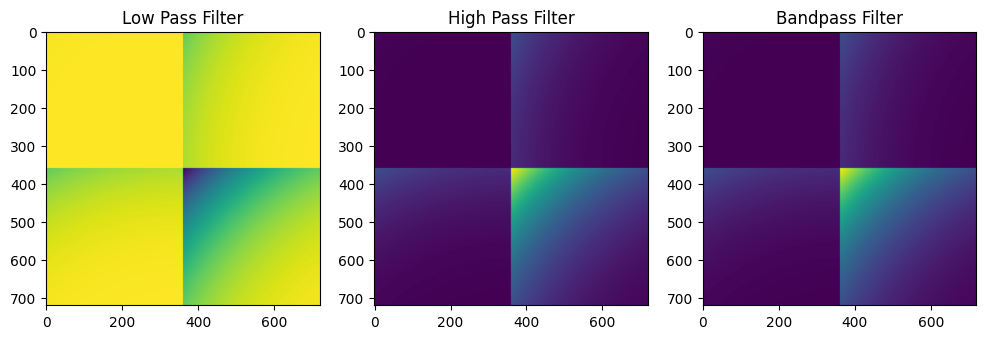

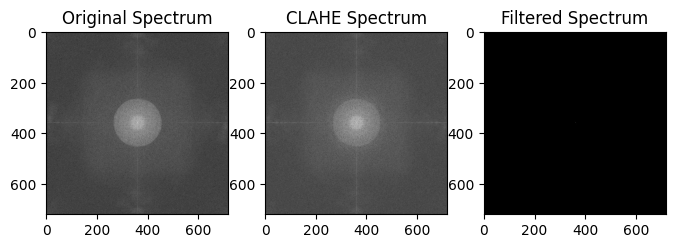

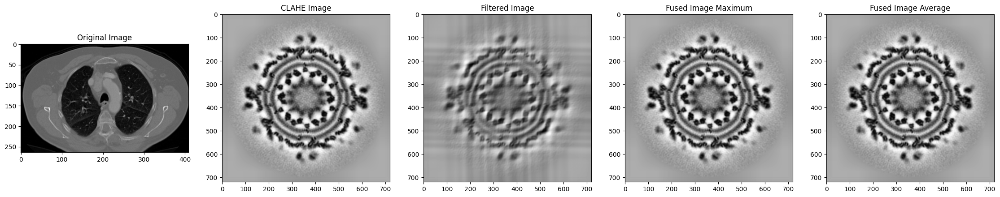

PSNR: 4.09 dB
MSE: 25375.75 - RMSE: 159.30
AMBE: 153.24
PSNR: inf dB
MSE: 0.00 - RMSE: 0.00
AMBE: 0.00
PSNR: 10.11 dB
MSE: 6343.94 - RMSE: 79.65
AMBE: 76.62


<ipython-input-8-9e9ef09d20d4>:25: RuntimeWarning: divide by zero encountered in double_scalars
  psnr = 10 * np.log10(max_pixel_value**2 / mse)


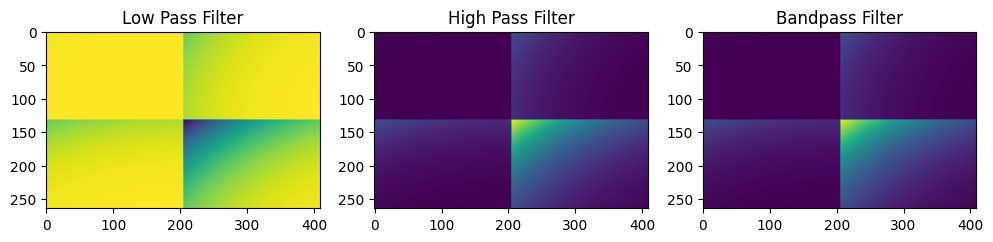

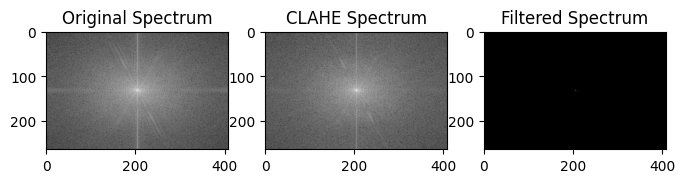

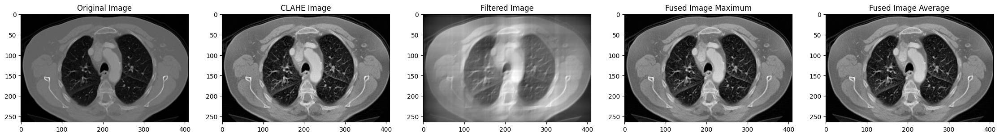

PSNR: 7.66 dB
MSE: 11155.19 - RMSE: 105.62
AMBE: 88.50
PSNR: inf dB
MSE: 0.00 - RMSE: 0.00
AMBE: 0.00
PSNR: 13.68 dB
MSE: 2788.80 - RMSE: 52.81
AMBE: 44.25


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import fftpack
from PIL import Image


def butterworth_bandpass_filter(image, low_cutoff, high_cutoff, filter_order):
    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2

    # Create a grid of frequencies
    u = np.fft.fftfreq(rows, 1 ) # 1 is the spacing between values
    v = np.fft.fftfreq(cols, 1)
    # u = np.fft.fftfreq(rows, 1.0 / rows)
    # v = np.fft.fftfreq(cols, 1.0 / cols)
    u, v = np.meshgrid(u, v, indexing='ij')  # 'ij' indexing produces a meshgrid with matrix indexing

    # Calculate distance from the origin
    # distance = np.sqrt(u**2 + v**2)
    # distance = np.sqrt((u - center_row)**2 + (v - center_col)**2)
    distance = np.sqrt((u - 0.5)**2 + (v - 0.5)**2)

    # Low Pass Filter
    HLP = 1 / (1 + (distance / low_cutoff)**(2 * filter_order))

    # High Pass Filter
    HHP = 1 - 1 / (1 + (distance / high_cutoff)**(2 * filter_order))

    # Bandpass Filter
    HBP = HLP * HHP

    # Visualize the filters
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(HLP, cmap='viridis')
    plt.title('Low Pass Filter')

    plt.subplot(1, 3, 2)
    plt.imshow(HHP, cmap='viridis')
    plt.title('High Pass Filter')

    plt.subplot(1, 3, 3)
    plt.imshow(HBP, cmap='viridis')
    plt.title('Bandpass Filter')

    plt.show()

    # Apply the filter to the Fourier transform of the image
    # filtered_fft = np.fft.fft2(image) * HBP
    filtered_fft = np.fft.fft2(image) * np.fft.fftshift(HBP)

    # Inverse Fourier transform to get the filtered image
    filtered_image = np.fft.ifft2(filtered_fft).real

    return filtered_image

# Example usage:
# Assuming 'your_image' is the image you want to filter
# Set your desired parameters
cut_frequency_low = 5
cut_frequency_high = 30
filter_order = 3

list = ['/content/drive/MyDrive/Colab Notebooks/Thesis/Preprocessing/temp/fft1.png',
        '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/sample/train/adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib/000000 (6).png']
for image_path in list:
    # img = Image.open(image_path).convert('L')
    # img_array = np.array(img)  # Convert the PIL Image to a numpy array
    img_array = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl1 = clahe.apply(img_array)

    # Apply Butterworth Bandpass Filter
    filtered_result = butterworth_bandpass_filter(cl1, cut_frequency_low, cut_frequency_high, filter_order)

    # Combine the filtered image with the original image
    fused_image1 = np.maximum(cl1, filtered_result)
    fused_image2 = (cl1 + filtered_result) / 2

    # Normalize pixel values for display
    cl1_display = cv2.normalize(cl1, None, 0, 255, cv2.NORM_MINMAX)
    filtered_result_display = cv2.normalize(filtered_result, None, 0, 255, cv2.NORM_MINMAX)
    fused_image1_display = cv2.normalize(fused_image1, None, 0, 255, cv2.NORM_MINMAX)
    fused_image2_display = cv2.normalize(fused_image2, None, 0, 255, cv2.NORM_MINMAX)

    # Calculate the Fourier transform of the original and filtered images
    original_fft = np.fft.fftshift(np.fft.fft2(img_array))
    cl1_fft = np.fft.fftshift(np.fft.fft2(cl1))
    filtered_fft = np.fft.fftshift(np.fft.fft2(filtered_result))

    # Calculate the magnitude spectrum of the Fourier transforms
    original_spectrum = np.log1p(np.abs(original_fft))
    cl1_spectrum = np.log1p(np.abs(cl1_fft))
    filtered_spectrum = np.log1p(np.abs(filtered_fft))

    # Display the original and filtered magnitude spectrums
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 3, 1)
    plt.title('Original Spectrum')
    plt.imshow(original_spectrum, cmap='gray')

    plt.subplot(1, 3, 2)
    plt.title('CLAHE Spectrum')
    plt.imshow(cl1_spectrum, cmap='gray')

    plt.subplot(1, 3, 3)
    plt.title('Filtered Spectrum')
    plt.imshow(filtered_spectrum, cmap='gray')

    plt.show()

    # Display the original and filtered images
    plt.figure(figsize=(28, 6))
    plt.subplot(1, 5, 1)
    plt.title('Original Image')
    plt.imshow(img, cmap='gray')

    plt.subplot(1, 5, 2)
    plt.title('CLAHE Image')
    plt.imshow(cl1_display, cmap='gray')

    plt.subplot(1, 5, 3)
    plt.title('Filtered Image')
    plt.imshow(filtered_result_display, cmap='gray')

    plt.subplot(1, 5, 4)
    plt.title('Fused Image Maximum')
    plt.imshow(fused_image1_display, cmap='gray')

    plt.subplot(1, 5, 5)
    plt.title('Fused Image Average')
    plt.imshow(fused_image2_display, cmap='gray')

    plt.show()

    # Calculate the metrics for the filtered image
    # Calculate metrics
    psnr_value, mse_value, rmse_value, ambe_value = calculate_metrics(cl1, filtered_result)

    # Print the results
    print(f"PSNR: {psnr_value:.2f} dB")
    print(f"MSE: {mse_value:.2f} - RMSE: {rmse_value:.2f}")
    print(f"AMBE: {ambe_value:.2f}")

    # Calculate metrics
    psnr_value, mse_value, rmse_value, ambe_value = calculate_metrics(cl1, fused_image1)

    # Print the results
    print(f"PSNR: {psnr_value:.2f} dB")
    print(f"MSE: {mse_value:.2f} - RMSE: {rmse_value:.2f}")
    print(f"AMBE: {ambe_value:.2f}")

    # Calculate metrics
    psnr_value, mse_value, rmse_value, ambe_value = calculate_metrics(cl1, fused_image2)

    # Print the results
    print(f"PSNR: {psnr_value:.2f} dB")
    print(f"MSE: {mse_value:.2f} - RMSE: {rmse_value:.2f}")
    print(f"AMBE: {ambe_value:.2f}")

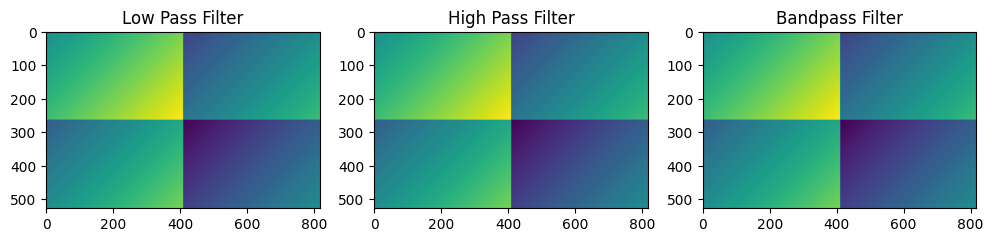

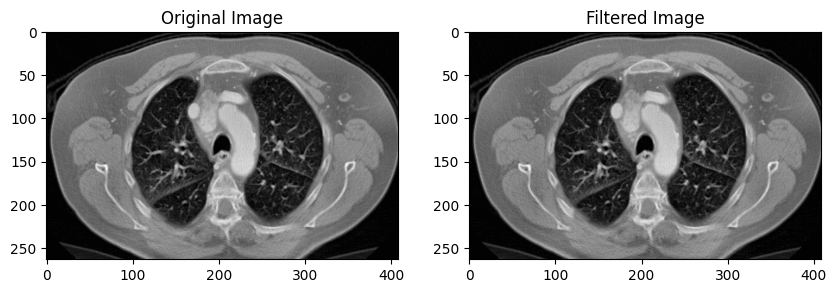

PSNR: 7.66 dB
MSE: 11155.19 - RMSE: 105.62
AMBE: 88.50


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def butterworth_bandpass_filter(image, low_cutoff, high_cutoff, filter_order):
    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2

    # Create a grid of frequencies
    u = np.fft.fftfreq(2 * rows - 1, 1)
    v = np.fft.fftfreq(2 * cols - 1, 1)
    u, v = np.meshgrid(u, v, indexing='ij')

    # Calculate distance from the origin
    distance = np.sqrt((u - center_row)**2 + (v - center_col)**2)

    # Butterworth Low Pass Filter
    HLP = 1 / (1 + (distance / high_cutoff)**(2 * filter_order))

    # Butterworth High Pass Filter
    HHP = 1 / (1 + (distance / low_cutoff)**(2 * filter_order))

    # Butterworth Bandpass Filter
    HBP = HLP * (1 - HHP)

    # Visualize the filters
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(HLP, cmap='viridis')
    plt.title('Low Pass Filter')

    plt.subplot(1, 3, 2)
    plt.imshow(HHP, cmap='viridis')
    plt.title('High Pass Filter')

    plt.subplot(1, 3, 3)
    plt.imshow(HBP, cmap='viridis')
    plt.title('Bandpass Filter')

    plt.show()

    # Apply the filter to the Fourier transform of the image
    filtered_fft = np.fft.fft2(image, s=(2 * rows - 1, 2 * cols - 1)) * np.fft.fftshift(HBP)

    # Inverse Fourier transform to get the filtered image
    filtered_image = np.fft.ifft2(filtered_fft).real[:rows, :cols]

    return filtered_image

# Example usage:
# Assuming 'your_image' is the image you want to filter
# Set your desired parameters
cut_frequency_low = 30
cut_frequency_high = 30
filter_order = 5

# Load the image
image_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/sample/train/adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib/000000 (6).png'
img_array = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply CLAHE
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
cl1 = clahe.apply(img_array)

# Apply Butterworth Bandpass Filter
filtered_result = butterworth_bandpass_filter(cl1, cut_frequency_low, cut_frequency_high, filter_order)

# Display the original and filtered images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(cl1, cmap='gray')

plt.subplot(1, 2, 2)
plt.title('Filtered Image')
plt.imshow(filtered_result, cmap='gray')

plt.show()

# Calculate the metrics for the filtered image
# Calculate metrics
psnr_value, mse_value, rmse_value, ambe_value = calculate_metrics(cl1, filtered_result)

# Print the results
print(f"PSNR: {psnr_value:.2f} dB")
print(f"MSE: {mse_value:.2f} - RMSE: {rmse_value:.2f}")
print(f"AMBE: {ambe_value:.2f}")


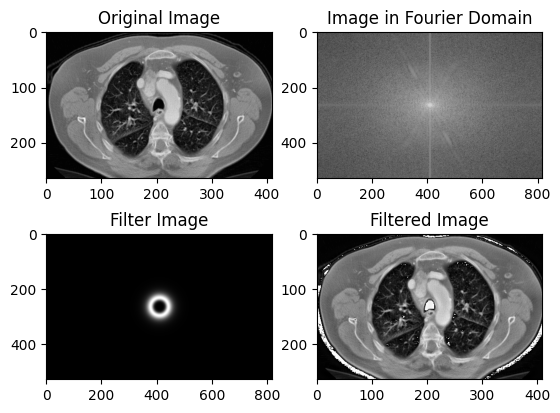

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def fftshow(f, type):
    if type == 'abs':
        fl = np.abs(f)
        fm = np.max(fl)
        plt.imshow(fl/fm, cmap='gray')
    elif type == 'log':
        fl = np.log(1 + np.abs(f))
        fm = np.max(fl)
        plt.imshow(fl/fm, cmap='gray')
    else:
        raise ValueError('TYPE must be abs or log.')

def butterworthbpf(I, d0, d1, n):
    f = np.double(I)
    nx, ny = f.shape
    f = np.uint8(f)
    fftI = np.fft.fftshift(np.fft.fft2(f, (2*nx-1, 2*ny-1)))

    plt.subplot(2, 2, 1)
    plt.imshow(f, cmap='gray')
    plt.title('Original Image')

    plt.subplot(2, 2, 2)
    fftshow(fftI, 'log')
    plt.title('Image in Fourier Domain')

    filter1 = np.ones((2*nx-1, 2*ny-1))
    filter2 = np.ones((2*nx-1, 2*ny-1))
    filter3 = np.ones((2*nx-1, 2*ny-1))

    for i in range(2*nx-1):
        for j in range(2*ny-1):
            dist = np.sqrt((i - (nx+1))**2 + (j - (ny+1))**2)
            filter1[i, j] = 1 / (1 + (dist / d1)**(2*n))
            filter2[i, j] = 1 / (1 + (dist / d0)**(2*n))
            filter3[i, j] = 1.0 - filter2[i, j]
            filter3[i, j] = filter1[i, j] * filter3[i, j]

    filtered_image = fftI + filter3 * fftI

    plt.subplot(2, 2, 3)
    fftshow(filter3, 'log')
    plt.title('Filter Image')

    filtered_image = np.fft.ifftshift(filtered_image)
    filtered_image = np.fft.ifft2(filtered_image, (2*nx-1, 2*ny-1))
    filtered_image = np.real(filtered_image[:nx, :ny])
    filtered_image = np.uint8(filtered_image)

    plt.subplot(2, 2, 4)
    plt.imshow(filtered_image, cmap='gray')
    plt.title('Filtered Image')

    plt.show()

# Example usage
ima = cv2.imread('/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/sample/train/adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib/000000 (6).png')
ima = cv2.cvtColor(ima, cv2.COLOR_BGR2GRAY)
# create a CLAHE object (Arguments are optional).
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
# cl1 = clahe.apply(gray)
cl1 = clahe.apply(ima)
filtered_image = butterworthbpf(cl1, 30, 35, 3)


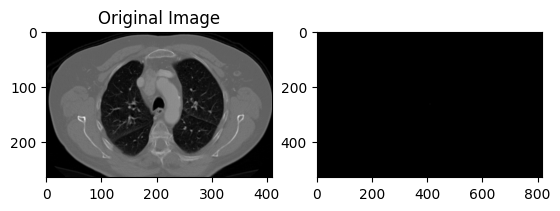

<ipython-input-25-d8e30b7cfaab>:46: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2, 2, 3)


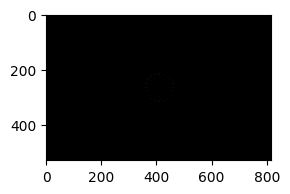

<ipython-input-25-d8e30b7cfaab>:56: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(2, 2, 4)


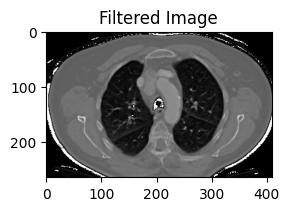

In [ ]:
import numpy as np
import cv2
from matplotlib import pyplot as plt

def fftshow(f, type='log'):
    if type == 'log':
        fl = np.log1p(np.abs(f))
        fm = np.max(fl)
        plt.imshow(np.uint8(fl/fm), cmap='gray')
    elif type == 'abs':
        fa = np.abs(f)
        fm = np.max(fa)
        plt.imshow(fa/fm, cmap='gray')
    else:
        raise ValueError('TYPE must be abs or log.')
    plt.show()

def butterworthbpf(I, d0, d1, n):
    f = np.double(I)
    nx, ny = f.shape
    fftI = np.fft.fft2(f, (2*nx-1, 2*ny-1))
    fftI = np.fft.fftshift(fftI)

    plt.subplot(2, 2, 1)
    plt.imshow(f, cmap='gray')
    plt.title('Original Image')

    plt.subplot(2, 2, 2)
    fftshow(fftI, 'log')
    plt.title('Image in Fourier Domain')

    filter1 = np.ones((2*nx-1, 2*ny-1))
    filter2 = np.ones((2*nx-1, 2*ny-1))
    filter3 = np.ones((2*nx-1, 2*ny-1))

    for i in range(2*nx-1):
        for j in range(2*ny-1):
            dist = np.sqrt((i - (nx+1))**2 + (j - (ny+1))**2)
            filter1[i, j] = 1 / (1 + (dist/d1)**(2*n))
            filter2[i, j] = 1 / (1 + (dist/d0)**(2*n))
            filter3[i, j] = 1.0 - filter2[i, j]
            filter3[i, j] = filter1[i, j] * filter3[i, j]

    filtered_image = fftI + filter3 * fftI

    plt.subplot(2, 2, 3)
    fftshow(filter3, 'log')
    plt.title('Filter Image')

    filtered_image = np.fft.ifftshift(filtered_image)
    filtered_image = np.fft.ifft2(filtered_image, (2*nx-1, 2*ny-1))
    filtered_image = np.real(filtered_image[0:nx, 0:ny])
    filtered_image = np.uint8(filtered_image)

    plt.subplot(2, 2, 4)
    plt.imshow(filtered_image, cmap='gray')
    plt.title('Filtered Image')

    plt.show()

# Example usage
img = cv2.imread('/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/sample/train/adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib/000000 (6).png', cv2.IMREAD_GRAYSCALE)
butterworthbpf(img, 50, 50, 3)


### CLAHE + Butterworth

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.fftpack import fftshift, ifftshift, fft2, ifft2

def butterworth_bandpass_filter(image, lowcut=15, highcut=30, filter_order=3):
    # # Method 1:
    # rows, cols = image.shape
    # x = np.linspace(-0.5, 0.5, cols) * cols
    # y = np.linspace(-0.5, 0.5, rows) * rows
    # [x, y] = np.meshgrid(x, y)
    # radius = np.sqrt((x ** 2) + (y ** 2))

    # # Compute the low-pass filter
    # lowpass = 1 / (1.0 + (radius / lowcut)**(2*filter_order))

    # # Compute the high-pass filter
    # highpass = 1.0 - 1 / (1.0 + (radius / highcut)**(2*filter_order))

    # # Multiply the filters to get the band-pass filter
    # bandpass = lowpass * highpass

    # # Apply the filter to the Fourier transform of the image
    # image_fft = fftshift(fft2(image))
    # filtered_fft = image_fft * bandpass

    # # Compute the inverse Fourier transform to get the filtered image
    # filtered_image = np.abs(ifft2(ifftshift(filtered_fft)))

    # # Scale the filtered image to the same range as the original image
    # min_val = np.min(image)
    # max_val = np.max(image) * 1.3 # Increase the maximum value to make the image brighter
    # filtered_image = (filtered_image - np.min(filtered_image)) * (max_val - min_val) / (np.max(filtered_image) - np.min(filtered_image)) + min_val

    # # # Add a constant value to all the pixels in the image to increase the brightness
    # # filtered_image += 1  # Adjust this value as needed

    # # Clip the pixel values to the valid range for images (0-255)
    # filtered_image = np.clip(filtered_image, 0, 255)

    # Method 2:
    rows, cols = image.shape

    # Create a grid of frequencies
    u = np.fft.fftfreq(rows, 1 ) # 1 is the spacing between values
    v = np.fft.fftfreq(cols, 1)
    u, v = np.meshgrid(u, v, indexing='ij')  # 'ij' indexing produces a meshgrid with matrix indexing


    # Calculate distance from the origin
    distance = np.sqrt(u**2 + v**2)

    # Low Pass Filter
    HLP = 1 / (1 + (distance / lowcut)**(2 * filter_order))

    # High Pass Filter
    HHP = 1 - 1 / (1 + (distance / highcut)**(2 * filter_order))

    # Bandpass Filter
    HBP = HLP * HHP

    # Apply the filter to the Fourier transform of the image
    # filtered_fft = np.fft.fft2(image) * HBP
    filtered_fft = np.fft.fft2(image) * np.fft.fftshift(HBP)

    # Inverse Fourier transform to get the filtered image
    filtered_image = np.fft.ifft2(filtered_fft).real

    # # Normalize the pixel values to the range 0-255
    # filtered_image = cv2.normalize(filtered_image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_8U)

    return filtered_image

In [ ]:
import os
import cv2
import numpy as np
from shutil import copyfile

def preprocess_and_copy(src_dir, dest_dir):
    # Check if src_dir is a directory
    if os.path.isdir(src_dir):
        # If dest_dir does not exist, create it
        os.makedirs(dest_dir, exist_ok=True)

        # Iterate over files/directories in src_dir
        for item in os.listdir(src_dir):
            src_item_path = os.path.join(src_dir, item)

            # If item is a directory, call function recursively
            if os.path.isdir(src_item_path):
                preprocess_and_copy(src_item_path, os.path.join(dest_dir, item))
            # If item is a file, apply preprocessing and copy
            elif os.path.isfile(src_item_path):
                # Define the output file path
                filename_with_ext = os.path.basename(src_item_path)
                filename, extension = os.path.splitext(filename_with_ext)
                dest_item_path = os.path.join(dest_dir, filename + '.jpg')

                # Check if output file already exists
                if not os.path.exists(dest_item_path):
                    # img = cv2.imread(src_item_path)
                    img = Image.open(src_item_path).convert('L')
                    if img is not None:
                        img = preprocess_func(img)

                        # Export the preprocessed image to the output folder
                        # cv2.imwrite(dest_item_path, img) # need normalize pixel[0,255]
                        cv2.imwrite(dest_item_path, img.astype(np.uint8))

# Define your preprocessing function here
def preprocess_func(img):
    # # TODO: Add your preprocessing steps here
    # gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_array = np.array(img)  # Convert the PIL Image to a numpy array


    # CLAHE (Contrast Limited Adaptive Histogram Equalization)
    # create a CLAHE object (Arguments are optional).
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    # cl1 = clahe.apply(gray)
    cl1 = clahe.apply(img_array)

    # Apply Butterworth bandpass filter with the current parameters
    filtered_img = butterworth_bandpass_filter(cl1, lowcut=15, highcut=30, filter_order=3)

    # Combine the filtered image with the original image
    fused_image = np.maximum(cl1, filtered_img)

    # return filtered_img
    return fused_image

# Usage:
dataset_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/sample'
output_path = '/content/drive/MyDrive/Colab Notebooks/Thesis/Preprocessing/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/CLAHE_Butterworth_sample5'
# dataset_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/dataset'
# output_path = '/content/drive/MyDrive/Colab Notebooks/Thesis/Preprocessing/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/CLAHE_Butterworth'
preprocess_and_copy(dataset_path, output_path)


In [ ]:
import os
import cv2
import numpy as np
from shutil import copyfile

def preprocess_and_copy(src_dir, dest_dir):
    # Check if src_dir is a directory
    if os.path.isdir(src_dir):
        # If dest_dir does not exist, create it
        os.makedirs(dest_dir, exist_ok=True)

        # Iterate over files/directories in src_dir
        for item in os.listdir(src_dir):
            src_item_path = os.path.join(src_dir, item)

            # If item is a directory, call function recursively
            if os.path.isdir(src_item_path):
                preprocess_and_copy(src_item_path, os.path.join(dest_dir, item))
            # If item is a file, apply preprocessing and copy
            elif os.path.isfile(src_item_path):
                # Define the output file path
                filename_with_ext = os.path.basename(src_item_path)
                filename, extension = os.path.splitext(filename_with_ext)
                dest_item_path = os.path.join(dest_dir, filename + '.jpg')

                # Check if output file already exists
                if not os.path.exists(dest_item_path):
                    # img = cv2.imread(src_item_path)
                    img = Image.open(src_item_path).convert('L')
                    if img is not None:
                        img = preprocess_func(img)

                        # Export the preprocessed image to the output folder
                        # cv2.imwrite(dest_item_path, img)
                        plt.imsave(dest_item_path, img, cmap='gray')

# Define your preprocessing function here
def preprocess_func(img):
    # # TODO: Add your preprocessing steps here
    # gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img_array = np.array(img)  # Convert the PIL Image to a numpy array


    # CLAHE (Contrast Limited Adaptive Histogram Equalization)
    # create a CLAHE object (Arguments are optional).
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    # cl1 = clahe.apply(gray)
    cl1 = clahe.apply(img_array)

    # Apply Butterworth bandpass filter with the current parameters
    filtered_img = butterworth_bandpass_filter(cl1, lowcut=15, highcut=30, filter_order=3)

    # Combine the filtered image with the original image
    # fused_image = (cl1 + filtered_img) / 2
    fused_image = np.maximum(cl1, filtered_img)

    # return filtered_img
    return fused_image

# Usage:
dataset_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/sample'
output_path = '/content/drive/MyDrive/Colab Notebooks/Thesis/Preprocessing/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/CLAHE_Butterworth_sample11'
# dataset_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/dataset'
# output_path = '/content/drive/MyDrive/Colab Notebooks/Thesis/Preprocessing/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/CLAHE_Butterworth'
preprocess_and_copy(dataset_path, output_path)


## Hydrid image filtering: median and mean filters
DOI: https://doi.org/10.1109/ICEECCOT.2017.8284595

The proposed technique combines both linear and nonlinear filters, specifically using median and mean filters, to enhance the precision of pixel values in a noisy image. Here's a breakdown of the process:

### a. Median Value Calculation:

The median filter processes the image pixel by pixel using a rectangular sub-image window or mask (e.g., 3x3). For each pixel at coordinates (x, y), the median value is calculated by sorting the pixel values within the window numerically and selecting the middle value for odd-sized windows. For even-sized windows, the median may have multiple possible values. The median value (Median) is calculated as follows:

$ \text{Median} = \text{median}\left\{(u,v) \in S_{xy}\right\} \{g(u,v)\} $

Where:
- $ S_{xy} $ is the set of coordinates in the rectangular sub-image window centered at (x, y).
- $ \text{median} $ represents the median value of the window.
- $ g(u,v) $ is the pixel value at coordinates (u, v) in the window.

### b. Average Value Calculation:

The average value is calculated using each pixel in the sub-image window ($ S_{xy} $) and the previously calculated median value. This process maximizes the utilization of neighboring pixels. The average value ($ \text{Averagevalue}_i $) for each pixel is calculated as follows:

$ \text{Averagevalue}_i = \text{average}\left\{(u,v) \in S_{xy}\right\} \{g_i(u,v), \text{Median}\} $

Where:
- $ g_i(u,v) $ is each pixel in the sub-image window.
- If the sub-window size is, for example, 3x4, there will be a total of 12 average values.

### c. Center Pixel Value Calculation:

The center pixel value is calculated by applying arithmetic mean filtering or averaging all the average values ($ \text{Averagevalue}_i $) of the sub-image window. This value is used to replace the original pixel value at coordinates (x, y). The calculation is given by:

$ \text{Center Pixel Value} = \frac{\sum_{i=1}^{N} \text{Averagevalue}_i}{N} $

Where:
- $ N $ is the product of the row (M) and column (N) dimensions of the rectangular sub-image window of size M x N centered at point (x, y).

### Giải thích:
Nếu kích thước của cửa sổ là (3, 4), thì tổng số điểm trong cửa sổ sẽ là 12 (3 hàng x 4 cột). Để minh họa cụ thể:

#### a. Median Value Calculation:

Giả sử cửa sổ là (3, 4) và pixel mục tiêu là ở tọa độ (x, y). Khi tính giá trị trung vị, bạn sắp xếp tất cả các giá trị pixel trong cửa sổ theo thứ tự tăng dần và chọn giá trị ở giữa (vì cửa sổ có số lượng lẻ):

$ \text{Median} = \text{median}\{(u,v) \in S_{xy}\} \{g(u,v)\} $

Ví dụ: Giả sử cửa sổ là $[3, 5, 2, 7, 8, 1, 4, 6, 9, 0, 11, 10]$, giá trị trung vị sẽ là $5$ (giữa ở giữa).

Trong đó:
*   x, y: Tọa độ của pixel chính mà bạn đang xem xét và muốn thay đổi giá trị.
*   $S_{xy}$ là tập hợp các tọa độ trong cửa sổ hình chữ nhật tại điểm $(x, y)$, và $\text{median}$ là giá trị trung vị của cửa sổ. Bạn cần sắp xếp tất cả các giá trị pixel trong cửa sổ (3, 4) và chọn giá trị ở giữa (đối với cửa sổ có số lượng lẻ) hoặc giá trị trung bình của hai giá trị giữa (đối với cửa sổ có số lượng chẵn).
*   u, v: Tọa độ của các pixel xung quanh pixel chính, được sử dụng trong quá trình duyệt qua các pixel trong một cửa sổ (window) hoặc mặt nạ để thực hiện các phép toán lọc.
*   $g(u, v)$ là giá trị của pixel tại $(u, v)$ trong cửa sổ $S_{xy}$

#### b. Average Value Calculation:

Khi tính giá trị trung bình, bạn tính tổng của tất cả các giá trị pixel trong cửa sổ và chia cho số lượng pixel:

$ \text{Averagevalue}_i = \text{average}\{(u,v) \in S_{xy}\} \{g_i(u,v), \text{Median}\} $

Ví dụ: Giả sử cửa sổ là $[3, 5, 2, 7, 8, 1, 4, 6, 9, 0, 11, 10]$, giá trị trung bình sẽ là $(3+5+2+7+8+1+4+6+9+0+11+10)/12 = 5.25$.

Ở đây, $g_i(u, v)$ thường đại diện cho giá trị của pixel tại tọa độ $(u, v)$ trong cửa sổ $S_{xy}$

#### c. Center Pixel Value Calculation:

Khi tính giá trị của pixel trung tâm, bạn tính trung bình của tất cả các giá trị trung bình đã tính:

$ \text{Center Pixel Value} = \frac{\sum_{i=1}^{N} \text{Averagevalue}_i}{N} $

Ở đây, $N$ là tổng số điểm trong cửa sổ hình chữ nhật, và nếu cửa sổ là (3, 4), thì $N$ là $3 \times 4 = 12$. Bạn tính trung bình của tất cả giá trị trung bình đã tính ở bước trước để có giá trị cuối cùng của pixel trung tâm.


[[156 106 114]
 [128 103 114]
 [136 136 147]]
128.0
[[142.  117.  121. ]
 [128.  115.5 121. ]
 [132.  132.  137.5]]
127.33333333333333 

[[106 114 190]
 [103 114  81]
 [136 147  96]]
114.0
[[110.  114.  152. ]
 [108.5 114.   97.5]
 [125.  130.5 105. ]]
117.38888888888889 

[[128 103 114]
 [136 136 147]
 [181 111 214]]
136.0
[[132.  119.5 125. ]
 [136.  136.  141.5]
 [158.5 123.5 175. ]]
138.55555555555554 

[[103 114  81]
 [136 147  96]
 [111 214  81]]
111.0
[[107.  112.5  96. ]
 [123.5 129.  103.5]
 [111.  162.5  96. ]]
115.66666666666667 

[[  0.           0.           0.           0.        ]
 [  0.         127.33333333 117.38888889   0.        ]
 [  0.         138.55555556 115.66666667   0.        ]
 [  0.           0.           0.           0.        ]]


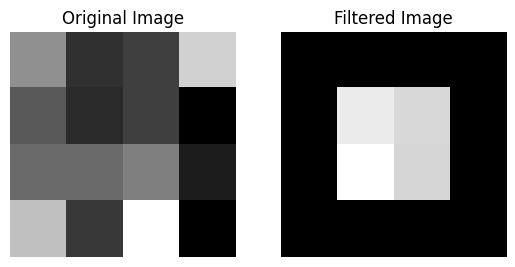

In [ ]:
'''
DOI: https://doi.org/10.1109/ICEECCOT.2017.8284595
Without using padding.
'''
import numpy as np
from scipy.ndimage import median_filter

def median_filter_window(window):
    return np.median(window)

def average_filter_window(window, median_value):
    return (window + median_value) / 2

def hybrid_filter(image, window_size):
    height, width = image.shape
    result_image = np.zeros_like(image, dtype=float)

    half_window_height, half_window_width = window_size[0] // 2, window_size[1] // 2

    for x in range(half_window_height, height - half_window_height):
        for y in range(half_window_width, width - half_window_width):
            sub_window = image[x - half_window_height:x + half_window_height + 1, y - half_window_width:y + half_window_width + 1]
            print(sub_window)

            # Median Value Calculation
            median_value = median_filter_window(sub_window)
            print(median_value)

            # Average Value Calculation
            average_values = average_filter_window(sub_window, median_value)
            print(average_values)

            # Center Pixel Value Calculation
            result_image[x, y] = np.mean(average_values)
            print(result_image[x, y], '\n')

    return result_image

# Example Original Image in Numpy
img = np.array([[156, 106, 114, 190],
            [128, 103, 114, 81],
            [136, 136, 147, 96],
            [181, 111, 214, 81]])

# Assuming image is a 2D NumPy array
window_size = (3, 3)  # Adjust the window size as needed

# Apply the filtering method
result = hybrid_filter(img, window_size)
print(result)

import matplotlib.pyplot as plt

# Assuming 'img' is your original image and 'result' is the filtered image

# Plot the original image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(img, cmap='gray')
plt.axis('off')

# Plot the filtered image
plt.subplot(1, 2, 2)
plt.title('Filtered Image')
plt.imshow(result, cmap='gray')
plt.axis('off')

# Show the plot
plt.show()



[[  0   0   0]
 [  0 156 106]
 [  0 128 103]]
0.0
[[ 0.   0.   0. ]
 [ 0.  78.  53. ]
 [ 0.  64.  51.5]]
27.38888888888889 

[[  0   0   0]
 [156 106 114]
 [128 103 114]]
106.0
[[ 53.   53.   53. ]
 [131.  106.  110. ]
 [117.  104.5 110. ]]
93.05555555555556 

[[  0   0   0]
 [106 114 190]
 [103 114  81]]
103.0
[[ 51.5  51.5  51.5]
 [104.5 108.5 146.5]
 [103.  108.5  92. ]]
90.83333333333333 

[[  0   0   0]
 [114 190   0]
 [114  81   0]]
0.0
[[ 0.   0.   0. ]
 [57.  95.   0. ]
 [57.  40.5  0. ]]
27.72222222222222 

[[  0 156 106]
 [  0 128 103]
 [  0 136 136]]
106.0
[[ 53.  131.  106. ]
 [ 53.  117.  104.5]
 [ 53.  121.  121. ]]
95.5 

[[156 106 114]
 [128 103 114]
 [136 136 147]]
128.0
[[142.  117.  121. ]
 [128.  115.5 121. ]
 [132.  132.  137.5]]
127.33333333333333 

[[106 114 190]
 [103 114  81]
 [136 147  96]]
114.0
[[110.  114.  152. ]
 [108.5 114.   97.5]
 [125.  130.5 105. ]]
117.38888888888889 

[[114 190   0]
 [114  81   0]
 [147  96   0]]
96.0
[[105.  143.   48. ]
 [105.   

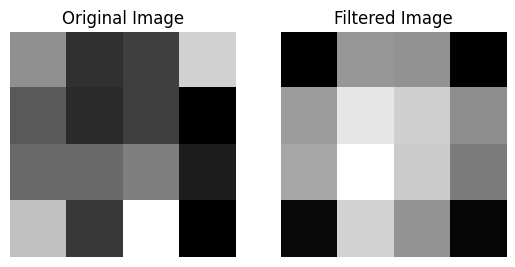

In [ ]:
'''
DOI: https://doi.org/10.1109/ICEECCOT.2017.8284595
Using padding for imnage border
Clean syntax.
'''
import numpy as np
from scipy.ndimage import median_filter

def hybrid_filter(image, window_size):
    height, width = image.shape

    # Calculate padding needed
    pad_height = window_size[0] // 2
    pad_width = window_size[1] // 2

    # Add padding to the image
    padded_image = cv2.copyMakeBorder(src=image, top=pad_height, bottom=pad_height, left=pad_width, right=pad_width, borderType=cv2.BORDER_CONSTANT, value=0) # cv2.BORDER_REFLECT

    # Create an output image with the same size as the input
    output_image = np.zeros_like(image, dtype=float)

    for x in range(pad_height, height + pad_height):
        for y in range(pad_width, width + pad_width):
            sub_window = padded_image[x - pad_height:x + pad_height + 1, y - pad_width:y + pad_width + 1]
            print(sub_window)

            # Median Value Calculation
            median_value = np.median(sub_window)
            print(median_value)

            # Average Value Calculation
            average_values = (sub_window + median_value) / 2
            print(average_values)

            # Center Pixel Value Calculation
            output_image[x - pad_height, y - pad_width] = np.mean(average_values)
            print(output_image[x - pad_height, y - pad_width], '\n')

    return output_image

img = np.array([[156, 106, 114, 190],
            [128, 103, 114, 81],
            [136, 136, 147, 96],
            [181, 111, 214, 81]])

# Assuming image is a 2D NumPy array
window_size = (3, 3)  # Adjust the window size as needed

# Apply the filtering method
result = hybrid_filter(img, window_size)
print(result)

import matplotlib.pyplot as plt

# Assuming 'img' is your original image and 'result' is the filtered image

# Plot the original image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(img, cmap='gray')
plt.axis('off')

# Plot the filtered image
plt.subplot(1, 2, 2)
plt.title('Filtered Image')
plt.imshow(result, cmap='gray')
plt.axis('off')

# Show the plot
plt.show()



### Method 2
https://oirl.github.io/Speckle-Hybrid-median-mean/

https://doi.org/10.1117/1.OE.60.12.123107

/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:265: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:223: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean, casting='unsafe',
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:257: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


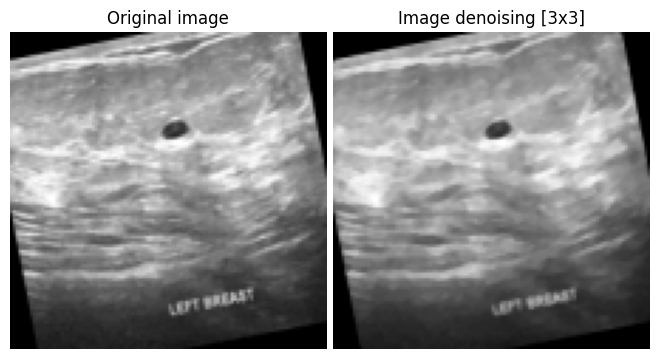

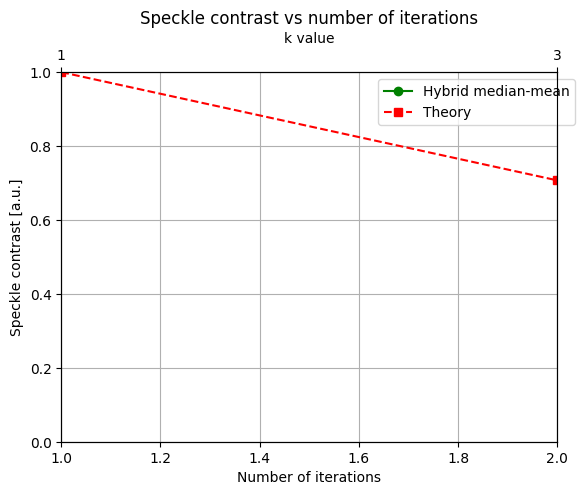

In [ ]:
# libraries
import numpy as np
import cv2
from scipy import ndimage
from matplotlib import pyplot as plt


def measure_speckle(sample):
    # Define ROI coordinates
    # x1 = 0
    # y1 = 0
    # x2, y2 = sample.shape

    # Resize the image to half its size
    height, width = sample.shape
    newimg = cv2.resize(sample, (int(width / 2), int(height / 2)))
    sample = newimg

    # Calculate the coordinates of the ROI
    x1 = int(width * 0.2)
    y1 = int(height * 0.3)
    x2 = int(width * 0.2)
    y2 = int(height * 0.6)

    roi_mean = sample[x1:x2, y1:y2]
    std_mean = np.std(roi_mean)
    mean_mean = np.mean(roi_mean)
    max_speckle_contrast = std_mean / mean_mean
    return max_speckle_contrast, x1, y1, x2, y2, sample


def speckle_reduction(max_speckle_contrast, x1, y1, x2, y2, sample, max_kernel_size):
    mean_image = sample
    height, width = sample.shape  # get size of the image
    dim_vectors = round(int(max_kernel_size + 1) / 2)
    list_cont = list(range(1, dim_vectors + 1))
    array_cont = np.array(list_cont)
    list_kernel = list(range(1, max_kernel_size + 2, 2))
    array_kernel_size = np.array(list_kernel)
    cont = 1
    array_speckle_contrast = np.zeros(1)
    array_speckle_contrast[0] = max_speckle_contrast
    speckle_contrast = np.zeros([height, width, dim_vectors])
    for i in range(3, max_kernel_size + 2, 2):
        filter = ndimage.median_filter(sample, i, mode='constant', cval=0)
        # mean_image = (mean_image + filter) / 2
        correction_factor = np.mean(sample) / np.mean(filter)
        mean_image = (mean_image + filter * correction_factor) / 2
        speckle_contrast[:, :, cont] = mean_image
        # measure of speckle contrast
        roi_mean = mean_image[x1:x2, y1:y2]
        std_mean = np.std(roi_mean)
        mean_mean = np.mean(roi_mean)
        constrast_speckle_mean = std_mean / mean_mean
        array_speckle_contrast = np.append(array_speckle_contrast, [constrast_speckle_mean])
        cont = cont + 1
    max_contrast = max(array_speckle_contrast)
    array_speckle_contrast = array_speckle_contrast / max_contrast
    return array_cont, array_speckle_contrast, speckle_contrast, dim_vectors, array_kernel_size


def images(sample, speckle_contrast, dim_z):
    plt.subplot(121).set_title("Original image")
    plt.imshow(sample, cmap=plt.cm.gray)
    plt.axis('off')
    plt.subplot(122).set_title("Image denoising [" + str((2*dim_z-1)) + 'x' + str((2*dim_z-1)) + ']')
    # plt.imshow(speckle_contrast[:, :, 2], cmap=plt.cm.gray)
    plt.imshow(speckle_contrast[:, :, dim_z - 1], cmap=plt.cm.gray)  # Use dim_z - 1 instead of 2
    plt.axis('off')
    plt.subplots_adjust(wspace=0.02, hspace=0.02, top=1, bottom=0, left=0, right=1)
    plt.show()


def plots_true(array_cont, array_speckle_contrast, array_kernel_size):
    theory = 1 / np.sqrt(array_cont)
    max_contrast = max(array_speckle_contrast)
    vec_contras_speckle = array_speckle_contrast / max_contrast
    plt.plot(array_cont, vec_contras_speckle, label="Hybrid median-mean", marker='o', color='green', linestyle='solid')
    plt.plot(array_cont, theory, label="Theory", marker='s', color='red', linestyle='dashed')
    plt.axis([1, array_cont.size, 0, 1])
    plt.xlabel("Number of iterations")
    plt.ylabel("Speckle contrast [a.u.]")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper right')
    plt.title('Speckle contrast vs number of iterations')
    plt.grid()
    ax2 = plt.twiny()
    ax2.set_xlabel('k value', color='black')
    ax2.set_xticks(array_kernel_size)
    ax2.set_xlim((1, array_kernel_size[-1]))
    plt.show()


def save(sample, speckle_contrast):
    cv2.imwrite('original image.jpg', sample)
    cv2.imwrite('denoising image.jpg', speckle_contrast[:, :, -1])

def HybridMedianMean(sample, max_kernel_size, figures, plots, save_image):
    if max_kernel_size % 2 == 0:
        print('Kernel size must be a odd number')
        exit()
    max_speckle_contrast, x1, y1, x2, y2, sample = measure_speckle(sample)
    array_cont, array_speckle_contrast, speckle_contrast, dim_z, array_kernel_size = speckle_reduction\
        (max_speckle_contrast, x1, y1, x2, y2, sample, max_kernel_size)
    if figures == "True":
        images(sample, speckle_contrast, dim_z)
    elif figures == "False":
        pass
    else:
        print('figure only get two options: True or False')
        exit()
    if plots == "True":
        plots_true(array_cont, array_speckle_contrast, array_kernel_size)
    elif plots == "False":
        pass
    else:
        print('plots only get two options: True or False')
        exit()
    if save_image == "True":
        save(sample, speckle_contrast)
    elif save_image == "False":
        pass
    else:
        print('save_image only get two options: True or False')
        exit()

# Load the image
img_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/dataset/val/benign/benign (1)-rotated1-rotated1.png'
# img_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/dataset/val/malignant/malignant (1)-rotated1-rotated1-rotated1.png'
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

max_kernel_size = 3
figures = 'True'
plots = 'True'
save_image = 'True'
HybridMedianMean(img, max_kernel_size, figures, plots, save_image)

### Trial

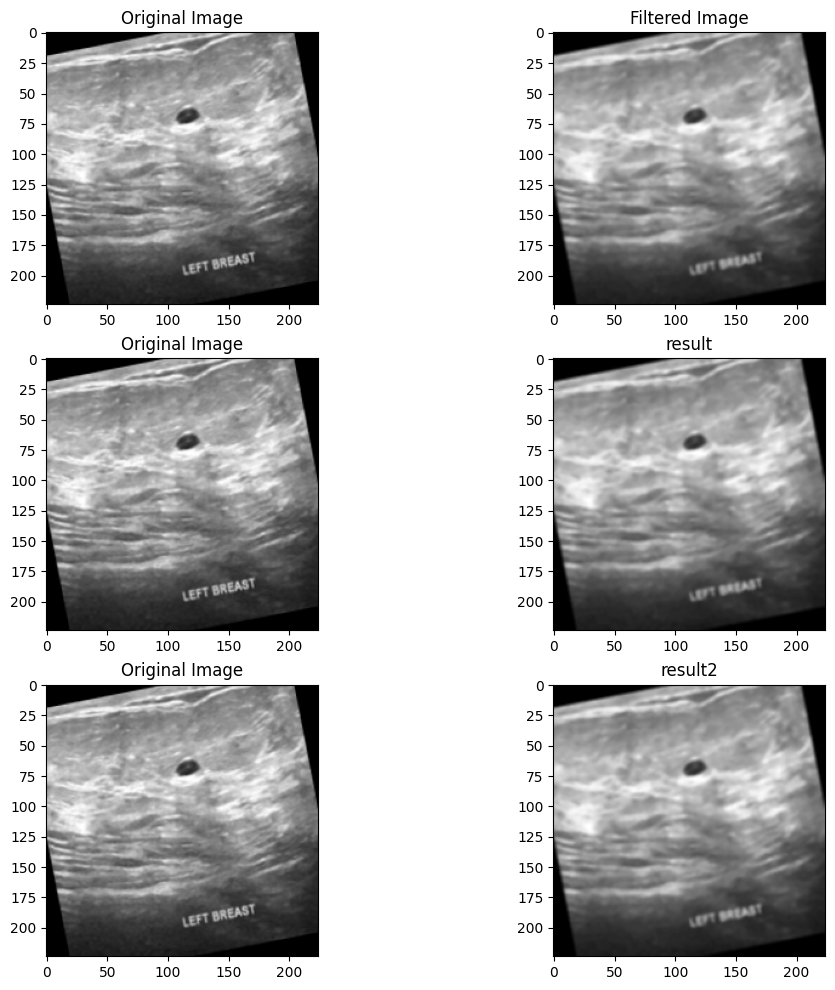

In [ ]:
# Import the necessary libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import median_filter

# Load the image
img_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/dataset/val/benign/benign (1)-rotated1-rotated1.png'
# img_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/dataset/val/malignant/malignant (1)-rotated1-rotated1-rotated1.png'
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

## Source: Github Copilot
def preprocess_func(img):
    # Convert the image to grayscale
    # gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    gray = img

    # Define the window size
    window_size = 3

    # Apply the median filter
    median_filtered_image = cv2.medianBlur(gray, window_size)

    # Define the padding for the convolution operation
    pad = window_size // 2

    # Pad the median filtered image
    padded_image = cv2.copyMakeBorder(median_filtered_image, pad, pad, pad, pad, cv2.BORDER_REFLECT)

    # Create an empty array to store the final image
    final_image = np.zeros_like(gray)

    # Apply the mean filter
    for i in range(gray.shape[0]):
        for j in range(gray.shape[1]):
            # Calculate the average value in the window around the pixel
            average_value = np.mean(padded_image[i:i+window_size, j:j+window_size])

            # Replace the original pixel value with the average value
            final_image[i, j] = int(average_value)

    return final_image

# Apply filter
filtered_img = preprocess_func(img)

## Source: ChatGPT
def median_and_mean_center_filter(image, window_size):
    # Apply median filtering
    median_filtered = median_filter(image, size=window_size)

    # Initialize result with zeros
    result = np.zeros_like(image, dtype=float)

    # Iterate over each pixel
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            # Extract the sub-window centered at (i, j)
            sub_window = median_filtered[max(0, i - window_size[0]//2):i + window_size[0]//2 + 1,
                                         max(0, j - window_size[1]//2):j + window_size[1]//2 + 1]

            # Calculate the average value for the sub-window
            average_value = np.mean(sub_window)

            # Update the result using the center pixel value
            result[i, j] = average_value

    return result

# Assuming image is a 2D NumPy array
window_size = (3, 3)  # Adjust the window size as needed

# Apply the filtering method
result = median_and_mean_center_filter(img, window_size)

## Source: ChatGPT # code 2
import numpy as np
from scipy.ndimage import median_filter

def hybrid_filter(image, window_size):
    height, width = image.shape

    # Calculate padding needed
    pad_height = window_size[0] // 2
    pad_width = window_size[1] // 2

    # Add padding to the image
    padded_image = cv2.copyMakeBorder(src=image, top=pad_height, bottom=pad_height, left=pad_width, right=pad_width, borderType=cv2.BORDER_CONSTANT, value=0) # cv2.BORDER_REFLECT

    # Create an output image with the same size as the input
    output_image = np.zeros_like(image, dtype=float)

    for x in range(pad_height, height + pad_height):
        for y in range(pad_width, width + pad_width):
            sub_window = padded_image[x - pad_height:x + pad_height + 1, y - pad_width:y + pad_width + 1]

            # Median Value Calculation
            median_value = np.median(sub_window)

            # Average Value Calculation
            average_values = (sub_window + median_value) / 2

            # Center Pixel Value Calculation
            output_image[x - pad_height, y - pad_width] = np.mean(average_values)

    return output_image

# Apply the filtering method
result2 = hybrid_filter(img, window_size)

# Display the original and processed images side by side
plt.figure(figsize=(12,12))

plt.subplot(3,2,1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')

plt.subplot(3,2,2)
plt.imshow(filtered_img, cmap='gray')
plt.title('Filtered Image')

plt.subplot(3,2,3)
plt.imshow(img, cmap='gray')
plt.title('Original Image')

plt.subplot(3,2,4)
plt.imshow(result, cmap='gray')
plt.title('result')

plt.subplot(3,2,5)
plt.imshow(img, cmap='gray')
plt.title('Original Image')

plt.subplot(3,2,6)
plt.imshow(result, cmap='gray')
plt.title('result2')

plt.show()

In [ ]:
from skimage.metrics import peak_signal_noise_ratio, mean_squared_error

def calculate_metrics(original, processed):
    # Calculate the PSNR
    psnr = peak_signal_noise_ratio(original, processed)

    # Calculate the RMSE
    rmse = np.sqrt(mean_squared_error(original, processed))

    # Calculate the SNR
    mean = np.mean(processed)
    std = np.std(processed)
    snr = 20 * np.log10(mean / (std + 1e-10)) # 1e-10: avoid error std=0

    return psnr, rmse, snr

# Calculate the metrics for the orginal image
psnr, rmse, snr = calculate_metrics(img, img)
print('Original Image')
print(f"PSNR: {psnr}")
print(f"RMSE: {rmse}")
print(f"SNR: {snr}")

# Calculate the metrics for the filtered image
psnr, rmse, snr = calculate_metrics(img, filtered_img)
print('\nGithub Copilot\'s code')
print(f"PSNR: {psnr}")
print(f"RMSE: {rmse}")
print(f"SNR: {snr}")

# Calculate the metrics for the result image
psnr, rmse, snr = calculate_metrics(img, result)
print('\nChatGPT\'s code')
print(f"PSNR: {psnr}")
print(f"RMSE: {rmse}")
print(f"SNR: {snr}")

# Calculate the metrics for the result image
psnr, rmse, snr = calculate_metrics(img, result2)
print('\nChatGPT\'s code2')
print(f"PSNR: {psnr}")
print(f"RMSE: {rmse}")
print(f"SNR: {snr}")

Original Image
PSNR: inf
RMSE: 0.0
SNR: 5.8695806244651605

Github Copilot's code
PSNR: 31.673617542123335
RMSE: 6.650576651862297
SNR: 6.015577960618179

ChatGPT's code
PSNR: 31.643795909476488
RMSE: 6.67344960112437
SNR: 6.038494183076399

ChatGPT's code2
PSNR: 34.773175206837614
RMSE: 4.654589870965032
SNR: 5.9624160095428955


/usr/local/lib/python3.10/dist-packages/skimage/metrics/simple_metrics.py:163: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)
<ipython-input-16-c6ecea96bdff>:5: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  psnr = peak_signal_noise_ratio(original, processed)


### Mass processing

In [ ]:
import os
import cv2
import numpy as np
from shutil import copyfile
# from scipy.ndimage import median_filter

def preprocess_and_copy(src_dir, dest_dir, preprocess_func):
    # Check if src_dir is a directory
    if os.path.isdir(src_dir):
        # If dest_dir does not exist, create it
        os.makedirs(dest_dir, exist_ok=True)

        # Iterate over files/directories in src_dir
        for item in os.listdir(src_dir):
            src_item_path = os.path.join(src_dir, item)

            # If item is a directory, call function recursively
            if os.path.isdir(src_item_path):
                preprocess_and_copy(src_item_path, os.path.join(dest_dir, item), preprocess_func)
            # If item is a file, apply preprocessing and copy
            elif os.path.isfile(src_item_path):
                # Define the output file path
                filename_with_ext = os.path.basename(src_item_path)
                filename, extension = os.path.splitext(filename_with_ext)
                dest_item_path = os.path.join(dest_dir, filename + '.jpg')

                # Check if output file already exists
                if not os.path.exists(dest_item_path):
                    img = cv2.imread(src_item_path)
                    if img is not None:
                        img = preprocess_func(img)

                        # Export the preprocessed image to the output folder
                        cv2.imwrite(dest_item_path, img)

def hybrid_filter(image, window_size):
    height, width = image.shape

    # Calculate padding needed
    pad_height = window_size[0] // 2
    pad_width = window_size[1] // 2

    # Add padding to the image
    padded_image = cv2.copyMakeBorder(src=image, top=pad_height, bottom=pad_height, left=pad_width, right=pad_width, borderType=cv2.BORDER_CONSTANT, value=0) # cv2.BORDER_REFLECT

    # Create an output image with the same size as the input
    output_image = np.zeros_like(image, dtype=float)

    for x in range(pad_height, height + pad_height):
        for y in range(pad_width, width + pad_width):
            sub_window = padded_image[x - pad_height:x + pad_height + 1, y - pad_width:y + pad_width + 1]

            # Median Value Calculation
            median_value = np.median(sub_window)

            # Average Value Calculation
            average_values = (sub_window + median_value) / 2

            # Center Pixel Value Calculation
            output_image[x - pad_height, y - pad_width] = np.mean(average_values)

    return output_image

# Define your preprocessing function here
def preprocess_func(img):
    # Convert the image to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Assuming image is a 2D NumPy array
    window_size = (3, 3)  # Adjust the window size as needed

    # Apply the filtering method
    filtered_image = hybrid_filter(gray, window_size)

    return filtered_image

# Usage:
# dataset_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/sample'
# output_path = '/content/drive/MyDrive/Colab Notebooks/Thesis/Preprocessing/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/Median-Mean-Hybrid-Filter_sample'
# dataset_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/dataset'
# output_path = '/content/drive/MyDrive/Colab Notebooks/Thesis/Preprocessing/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/Median-Mean-Hybrid-Filter'
dataset_path = '/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/dataset/train/benign'
output_path = '/content/drive/MyDrive/Colab Notebooks/Thesis/Preprocessing/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/Median-Mean-Hybrid-Filter/train/benign'
preprocess_and_copy(dataset_path, output_path, preprocess_func)


## CLAHE + medianBlur + GaussianBlur

In [ ]:
# Import the necessary libraries
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image
img_path = '/content/drive/MyDrive/Colab Notebooks/Thesis/Preprocessing/ChestXRay_CLAHE/covid/0a7faa2a.jpg'
img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)

# Apply a median filter to reduce noise
median_img = cv2.medianBlur(img, 3)

# Apply an unsharp mask to enhance the edges
blurred = cv2.GaussianBlur(median_img, (5,5), 0)
sharp_img = cv2.addWeighted(median_img, 1.5, blurred, -0.5, 0)

# Display the original and processed images side by side
plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')

plt.subplot(1,2,2)
plt.imshow(sharp_img, cmap='gray')
plt.title('median_img')

plt.show()

error: OpenCV(4.8.0) /io/opencv/modules/imgproc/src/median_blur.dispatch.cpp:283: error: (-215:Assertion failed) !_src0.empty() in function 'medianBlur'


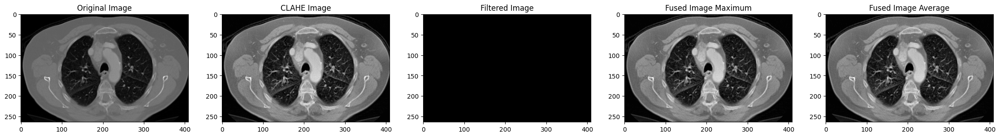

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

def fftshow(im, log=False):
    if log:
        return np.log(1 + np.abs(im))
    else:
        return np.abs(im)

def butterworth_bandpass_filter(image, low_cutoff, high_cutoff, filter_order):
    rows, cols = image.shape
    center_row, center_col = rows // 2, cols // 2

    # Create a grid of frequencies
    u = np.fft.fftfreq(rows, 1)
    v = np.fft.fftfreq(cols, 1)
    u, v = np.meshgrid(u, v, indexing='ij')

    # Calculate distance from the origin
    distance = np.sqrt((u - center_row)**2 + (v - center_col)**2)

    # Low Pass Filter
    HLP = 1 / (1 + (distance / low_cutoff)**(2 * filter_order))

    # High Pass Filter
    HHP = 1 - 1 / (1 + (distance / high_cutoff)**(2 * filter_order))

    # Bandpass Filter
    HBP = HLP * HHP

    # Apply the filter to the Fourier transform of the image
    filtered_fft = np.fft.fft2(image) * np.fft.fftshift(HBP)

    # Inverse Fourier transform to get the filtered image
    filtered_image = np.fft.ifft2(filtered_fft).real

    return filtered_image.astype(np.uint8)

# Load the image
img_array = cv2.imread('/content/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/sample/train/adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib/000000 (6).png', cv2.IMREAD_GRAYSCALE)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
cl1 = clahe.apply(img_array)

# Set your desired parameters
cut_frequency_low = 5
cut_frequency_high = 120
filter_order = 3

# Apply Butterworth Bandpass Filter
filtered_result = butterworth_bandpass_filter(cl1, cut_frequency_low, cut_frequency_high, filter_order)

# Combine the filtered image with the original image
fused_image1 = np.maximum(cl1, filtered_result)
fused_image2 = (cl1 + filtered_result) / 2

# Normalize pixel values for display
cl1_display = cv2.normalize(cl1, None, 0, 255, cv2.NORM_MINMAX)
filtered_result_display = cv2.normalize(filtered_result, None, 0, 255, cv2.NORM_MINMAX)
fused_image1_display = cv2.normalize(fused_image1, None, 0, 255, cv2.NORM_MINMAX)
fused_image2_display = cv2.normalize(fused_image2, None, 0, 255, cv2.NORM_MINMAX)

# Display the results
plt.figure(figsize=(28, 6))
plt.subplot(1, 5, 1)
plt.title('Original Image')
plt.imshow(img_array, cmap='gray')

plt.subplot(1, 5, 2)
plt.title('CLAHE Image')
plt.imshow(cl1_display, cmap='gray')

plt.subplot(1, 5, 3)
plt.title('Filtered Image')
plt.imshow(filtered_result_display, cmap='gray')

plt.subplot(1, 5, 4)
plt.title('Fused Image Maximum')
plt.imshow(fused_image1_display, cmap='gray')

plt.subplot(1, 5, 5)
plt.title('Fused Image Average')
plt.imshow(fused_image2_display, cmap='gray')

plt.show()


In [ ]:
def average_filter_window(window, median_value):
    return (window + median_value) / 2

sub_window = np.array([[1, 2, 3],
                       [4, 5, 6],
                       [7, 8, 9]])
median_value = 5
average_values = average_filter_window(sub_window, median_value)

print(average_values)


[[3.  3.5 4. ]
 [4.5 5.  5.5]
 [6.  6.5 7. ]]


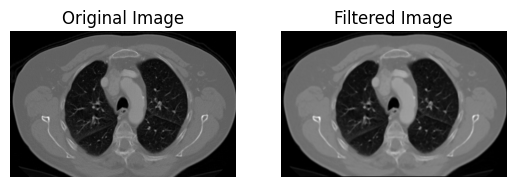

In [ ]:
import numpy as np
from scipy.ndimage import median_filter

def median_filter_window(window):
    return np.median(window)

def average_filter_window(window, median_value):
    return (window + median_value) / 2

def hybrid_filter(image, window_size):
    height, width = image.shape
    result_image = np.zeros_like(image, dtype=float)

    half_window_height, half_window_width = window_size[0] // 2, window_size[1] // 2

    for x in range(half_window_height, height - half_window_height):
        for y in range(half_window_width, width - half_window_width):
            sub_window = image[x - half_window_height:x + half_window_height + 1, y - half_window_width:y + half_window_width + 1]

            # Median Value Calculation
            median_value = median_filter_window(sub_window)

            # Average Value Calculation
            average_values = average_filter_window(sub_window, median_value)

            # Center Pixel Value Calculation
            result_image[x, y] = np.mean(average_values)

    return result_image

# Assuming image is a 2D NumPy array
window_size = (3, 3)  # Adjust the window size as needed

# Apply the filtering method
result = hybrid_filter(img, window_size)


cv2.imwrite('output.jpg', result)


import matplotlib.pyplot as plt

# Assuming 'img' is your original image and 'result' is the filtered image

# Plot the original image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(img, cmap='gray')
plt.axis('off')

# Plot the filtered image
plt.subplot(1, 2, 2)
plt.title('Filtered Image')
plt.imshow(result, cmap='gray')
plt.axis('off')

# Show the plot
plt.show()



[[  0   0   0]
 [  0 156 106]
 [  0 128 103]]
0.0
[[ 0.   0.   0. ]
 [ 0.  78.  53. ]
 [ 0.  64.  51.5]]
27.38888888888889 

[[  0   0   0]
 [156 106 114]
 [128 103 114]]
106.0
[[ 53.   53.   53. ]
 [131.  106.  110. ]
 [117.  104.5 110. ]]
93.05555555555556 

[[  0   0   0]
 [106 114 190]
 [103 114  81]]
103.0
[[ 51.5  51.5  51.5]
 [104.5 108.5 146.5]
 [103.  108.5  92. ]]
90.83333333333333 

[[  0   0   0]
 [114 190   0]
 [114  81   0]]
0.0
[[ 0.   0.   0. ]
 [57.  95.   0. ]
 [57.  40.5  0. ]]
27.72222222222222 

[[  0 156 106]
 [  0 128 103]
 [  0 136 136]]
106.0
[[ 53.  131.  106. ]
 [ 53.  117.  104.5]
 [ 53.  121.  121. ]]
95.5 

[[156 106 114]
 [128 103 114]
 [136 136 147]]
128.0
[[142.  117.  121. ]
 [128.  115.5 121. ]
 [132.  132.  137.5]]
127.33333333333333 

[[106 114 190]
 [103 114  81]
 [136 147  96]]
114.0
[[110.  114.  152. ]
 [108.5 114.   97.5]
 [125.  130.5 105. ]]
117.38888888888889 

[[114 190   0]
 [114  81   0]
 [147  96   0]]
96.0
[[105.  143.   48. ]
 [105.   

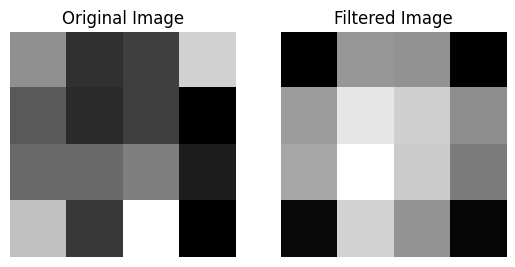

In [ ]:
import numpy as np
from scipy.ndimage import median_filter

def median_filter_window(window):
    return np.median(window)

def average_filter_window(window, median_value):
    return (window + median_value) / 2

def hybrid_filter(image, window_size):
    height, width = image.shape
    output_image = np.zeros_like(image, dtype=float)
    # half_window_height, half_window_width = window_size[0] // 2, window_size[1] // 2
    # for x in range(half_window_height, height - half_window_height):
    #     for y in range(half_window_width, width - half_window_width):
    #         sub_window = image[x - half_window_height:x + half_window_height + 1, y - half_window_width:y + half_window_width + 1]

    # Calculate padding needed
    pad_height = window_size[0] // 2
    pad_width = window_size[1] // 2

    # Add padding to the image
    padded_image = cv2.copyMakeBorder(image, pad_height, pad_height, pad_width, pad_width, cv2.BORDER_CONSTANT, value=0) # cv2.BORDER_REFLECT

    # Create an output image with the same size as the input
    output_image = np.zeros_like(image, dtype=float)

    for x in range(pad_height, height + pad_height):
        for y in range(pad_width, width + pad_width):
            sub_window = padded_image[x - pad_height:x + pad_height + 1, y - pad_width:y + pad_width + 1]
            print(sub_window)

            # Median Value Calculation
            median_value = median_filter_window(sub_window)
            print(median_value)

            # Average Value Calculation
            average_values = average_filter_window(sub_window, median_value)
            print(average_values)

            # Center Pixel Value Calculation
            # output_image[x, y] = np.mean(average_values)
            output_image[x - pad_height, y - pad_width] = np.mean(average_values)
            print(output_image[x - pad_height, y - pad_width], '\n')

    return output_image

img = np.array([[156, 106, 114, 190],
            [128, 103, 114, 81],
            [136, 136, 147, 96],
            [181, 111, 214, 81]])

# Assuming image is a 2D NumPy array
window_size = (3, 3)  # Adjust the window size as needed

# Apply the filtering method
result = hybrid_filter(img, window_size)
print(result)

import matplotlib.pyplot as plt

# Assuming 'img' is your original image and 'result' is the filtered image

# Plot the original image
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(img, cmap='gray')
plt.axis('off')

# Plot the filtered image
plt.subplot(1, 2, 2)
plt.title('Filtered Image')
plt.imshow(result, cmap='gray')
plt.axis('off')

# Show the plot
plt.show()



In [ ]:
from scipy import ndimage

img = np.array([[156, 106, 114, 190],
            [128, 103, 114, 81],
            [136, 136, 147, 96],
            [181, 111, 214, 81]])
filter = ndimage.median_filter(img, size=3, mode='constant', cval=0)
print(filter)
filter = ndimage.mean(img)
filter

[[  0 106 103   0]
 [106 128 114  96]
 [111 136 111  81]
 [  0 136  96   0]]


130.875

In [ ]:
window_size = (3,3)
half_window_height, half_window_width = window_size[0] // 2, window_size[1] // 2
height, width = img.shape
for x in range(half_window_height, height - half_window_height):
    for y in range(half_window_width, width - half_window_width):
        sub_window = img[x - half_window_height:x + half_window_height + 1, y - half_window_width:y + half_window_width + 1]
        print(sub_window)

        # Median Value Calculation
        median_value = median_filter_window(sub_window)
        print(median_value,'\n')



[[156 106 114]
 [128 103 114]
 [136 136 147]]
128.0 

[[106 114 190]
 [103 114  81]
 [136 147  96]]
114.0 

[[128 103 114]
 [136 136 147]
 [181 111 214]]
136.0 

[[103 114  81]
 [136 147  96]
 [111 214  81]]
111.0 



In [ ]:
import cv2

img = np.array([[156, 106, 114, 190],
            [128, 103, 114, 81],
            [136, 136, 147, 96],
            [181, 111, 214, 81]])

# Convert the image to 8-bit
img_8bit = np.uint8(img)

# Apply a median filter to reduce noise
median_img = cv2.medianBlur(img_8bit, 3)
print(median_img)

[[128 114 114 114]
 [136 128 114 114]
 [136 136 111  96]
 [136 147 111  96]]
